# Лабораторная работа №1
## Условия:
Лабораторная работа # 1 Методы нулевого и первого
порядка
Основной язык/среда выполнения лабораторных работ Python 3, Jupyter
notebook, Google collab. При желании можно экспериментировать на других
языках: Julia, Mojo, С++ и т.д. Лабораторные работы выполняются
индивидуально или в группах по 2-3-4 человека. По результатам выполнения
лабораторной работы необходимо подготовить отчет. Отчёт должен содержать
постановку задачи, описание используемых методов, (ссылку на) реализацию,
результаты исследования (графики и таблицы, которые их демонстрируют,
анализ результатов, преимуществ и ограничений методов). Так в этом тексте
выделяются библиотеки, так то, что полезно для следующих лабораторных.
Лабораторная состоит из основного и двух дополнительных заданий.
Основное задание
Разработка. Реализуйте следующие методы:
1. метод градиентного спуска с различными стратегиями выбора шага
(learning rate scheduling);
2. любой метод одномерного поиска и градиентный спуск на его основе;
3. изучите возможности библиотеки scipy.optimize. Найдите и используйте
для сравнения библиотечные аналоги реализованных Вами методов.


Обратите внимание на используемые hyperпараметры. В реализации их следует
выносить в интерфейс метода. В реализации лучше продумать предохранители,
например, ограничение на число итераций.
Исследование



[Объект исследования] Примените реализованные Вами и библиотечные
методы на квадратичных функциях двух переменных. Можно также
дополнительно поискать и использовать функции с более сложным поведением.
Оставьте 2-3 функции, наиболее интересные для демонстрации, то есть такие,
на которых эффективность методов будет явно отличаться.


[Суть исследования] Сравните работу методов на выбранных функциях в
зависимости от выбора начальной точки, стратегии выбора шага или значений
гиперпараметров, числа обусловленности. Показателями эффективности
методов при выбранных условиях будут: количество итераций и количество
вычислений значений минимизируемой функции и ее производной (градиента),
до достижения критерия остановки.


Дополнительное задание 1 (дополнительный метод)
Реализуйте ещё один метод одномерного поиска и градиентный спуск на его
основе (можно взять методы, как обсуждаемые на лекциях, так и другие) и
исследуйте его на эффективность в сравнении с другими методами.


Дополнительное задание 2 (дополнительные объекты)
Подберите мультимодальную функцию, проведите исследование для неё.
Подберите функцию с зашумленными значениями, проведите исследование для
неё (к значениям уже выбранных функций можно прибавлять некоторую
случайную величину). Ещё лучше, если “величина мультимодальности” и/или
зашумлённости будут зависить от параметра, и можно будет сравнить
результаты при его разных значениях.
Оформление


[Описание методов] В начале отчёта опишите используемые методы. В
описании метода укажите, это реализованный Вами или библиотечный метод,
из какой библиотеки он взят, или какую библиотеку использует внутри
реализации, если использует. При наличии, указывайте важные особенности
Вашей реализации метода, они могут быть алгоритмические (например,
имеющиеся hyperпараметры), так и технические (например, использование
мемоизации в алгоритме).


[Графики]
Нарисуйте графики с линиями уровня и траекториями методов (в области
задания, 2D; можно и в 3D, на графиках рассматриваемых функций).


[Описание результатов]
В результатах работы метода должна быть следующая информация:
- объект исследования (функция) к которой применяется метод, начальная
точка;
- особенности применения метода: стратегия выбора шага, значение
гиперпараметров, критерий остановки;
- результат, количество итераций, количество вычислений значений функции и
её производной (градиента);


Критерии оценивания
1. Работоспособность и качество кода.
2. Полнота отчета.
3. Знание теории, которая лежит в основе применяемых методов.
4. Дополнительное задание 1.
5. Дополнительное задание 2.
Каждый критерий оценивается максимально в 5 баллов.
Максимальный балл за лабораторную работу составляет 25 баллов.

# Первый пункт лабораторной
## Импорты:

In [2]:
from gradient_descent import *

Exponential Decay, minimum found at: [0.06566095 0.06566095] f(minX) is 0.008622719800115903
Iterations: 20000, Time taken: 0.3351 seconds


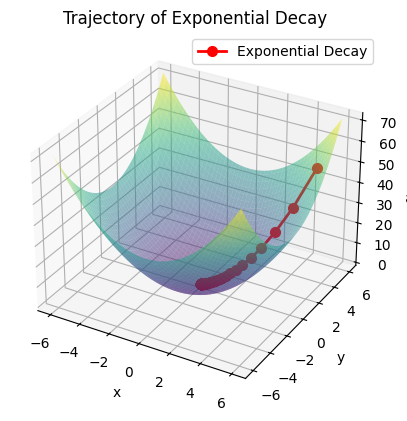

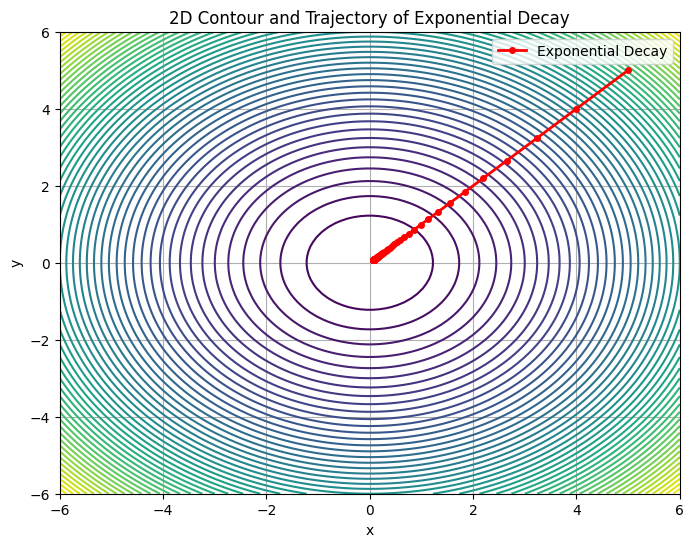

Polynomial Decay, minimum found at: [3.52552945e-09 3.52552945e-09] f(minX) is 2.4858715747110376e-17
Iterations: 2805, Time taken: 0.0456 seconds


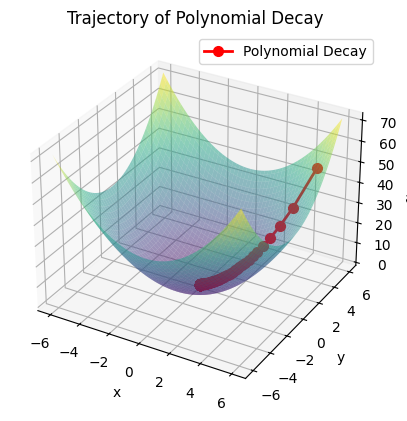

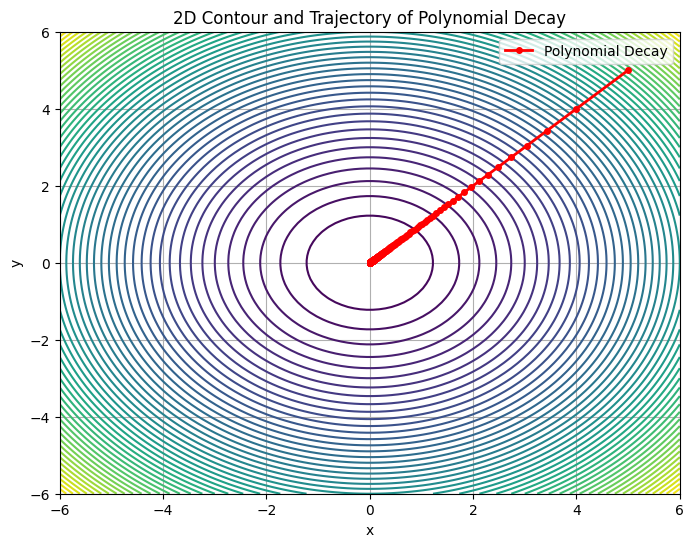

Constant Decay, minimum found at: [3.10827032e-09 3.10827032e-09] f(minX) is 1.932268876831308e-17
Iterations: 95, Time taken: 0.0016 seconds


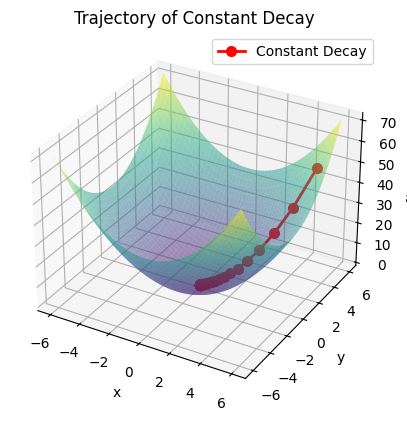

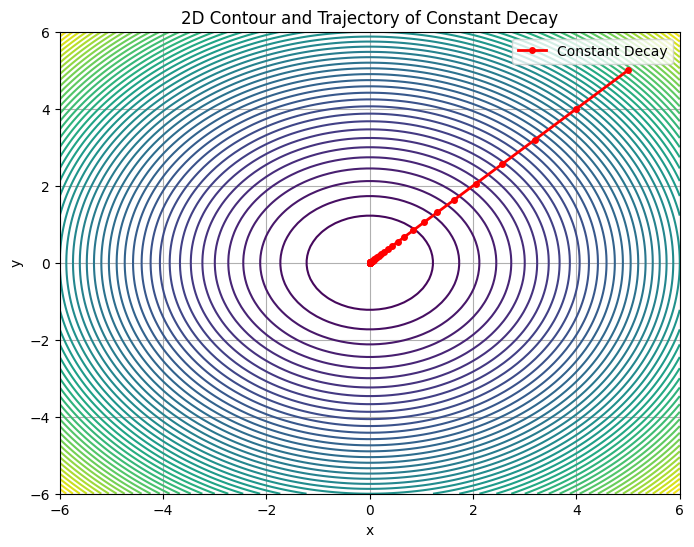

Step Decay, minimum found at: [3.52513175e-09 3.52513175e-09] f(minX) is 2.485310770100279e-17
Iterations: 280, Time taken: 0.0046 seconds


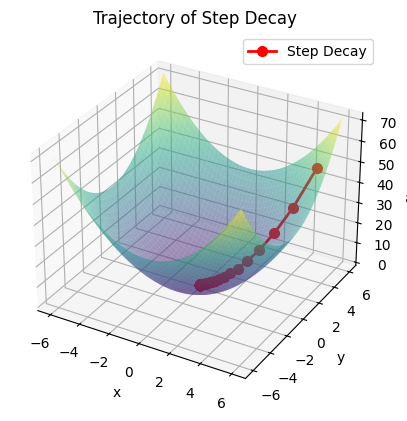

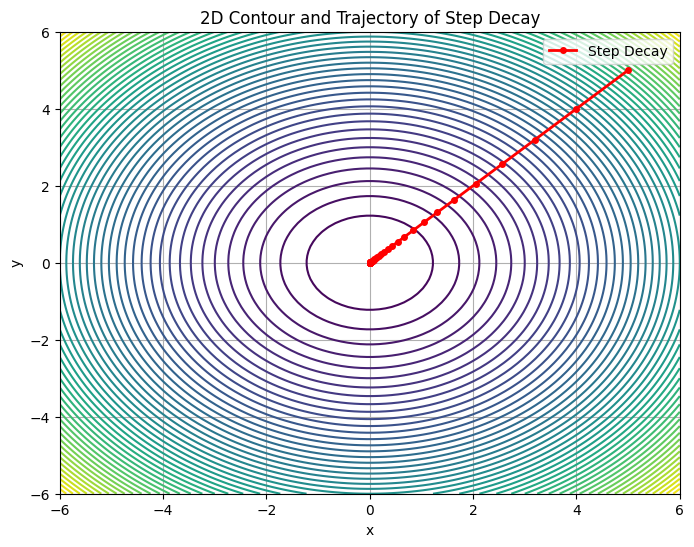

In [3]:
# Функция №1 (квадратичная)
def quadratic_function(x):
    return x[0] ** 2 + x[1] ** 2


func1 = Function(quadratic_function)

methods = [
    ExponentialDecay(learning_rate=0.1, lambd=0.05),
    PolynomialDecay(learning_rate=0.1, alpha=0.5, beta=1),
    ConstantDecay(learning_rate=0.1),
    StepDecay(learning_rate=0.1, step_size=50, decay_factor=0.5)
]

x0 = [5.0, 5.0]
func1.plot_all_methods(methods, x0)


## Функция №2: Функция Розенброка с визуализацией:

Данная функция является выпуклой, гладкой, имеет глобальный минимум в точке `[0, 0]`, что делает её отличным примером для тестирования градиентных методов оптимизации.

---

## ⚙️ Используемые методы

Реализованы и протестированы следующие стратегии градиентного спуска (методы реализованы вручную без использования `scipy.optimize`):

| Метод               | Стратегия выбора шага                         | Гиперпараметры                                 |
|---------------------|-----------------------------------------------|------------------------------------------------|
| **Exponential Decay** | `αₜ = α₀ * exp(-λ * t)`                      | `learning_rate=0.1`, `lambda=0.05`             |
| **Polynomial Decay**  | `αₜ = α₀ / (1 + β * t)^α`                    | `learning_rate=0.1`, `alpha=0.5`, `beta=1`     |
| **Constant Decay**    | Постоянный шаг                               | `learning_rate=0.1`                            |
| **Step Decay**        | Уменьшение шага через каждые `step_size` итераций | `learning_rate=0.1`, `step_size=50`, `decay_factor=0.5` |

---

## 📊 Результаты экспериментов

### 🔹 Начальная точка: `[5.0, 5.0]`

| Метод                | Найденный минимум             | f(min)                 | Итерации | Время (сек) |
|----------------------|-------------------------------|-------------------------|----------|--------------|
| **Exponential Decay** | `[0.0657, 0.0657]`           | `8.62e-3`              | 20000    | 0.3351       |
| **Polynomial Decay**  | `[3.53e-9, 3.53e-9]`         | `2.49e-17`             | 2805     | 0.0456       |
| **Constant Decay**    | `[3.11e-9, 3.11e-9]`         | `1.93e-17`             | 95       | 0.0016       |
| **Step Decay**        | `[3.53e-9, 3.53e-9]`         | `2.49e-17`             | 280      | 0.0046       |

---

## 📈 Визуализация

Для каждого метода построены:

- **3D графики**: поверхность функции и траектория движения по ней
- **2D контурные графики**: линии уровня и траектория градиентного спуска

---

## 🧠 Выводы

- **Constant Decay** показал наилучшие результаты по скорости и количеству итераций, но может быть неустойчив при более сложных функциях.
- **Exponential Decay** оказался наименее эффективным — сходимость слишком медленная, требуется очень тонкая настройка параметров.
- **Polynomial Decay** и **Step Decay** показали хорошую сходимость и баланс между скоростью и стабильностью. Особенно интересны для задач с более сложной геометрией функции.
- Стратегия изменения шага оказывает значительное влияние на поведение метода и его эффективность.

---


- Сравнить с реализациями из библиотеки `scipy.optimize` (например, `minimize(method='CG')` или `BFGS`).



Exponential Decay, minimum found at: [0.98497125 0.97010768] f(minX) is 0.0002262316397352928
Iterations: 20000, Time taken: 0.3592 seconds


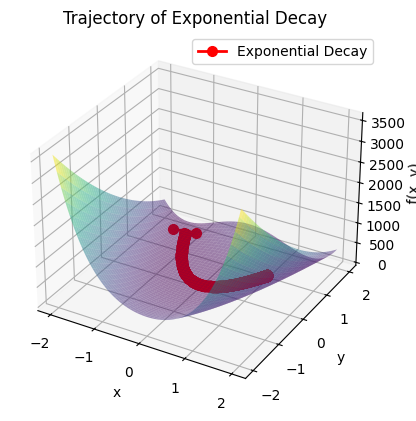

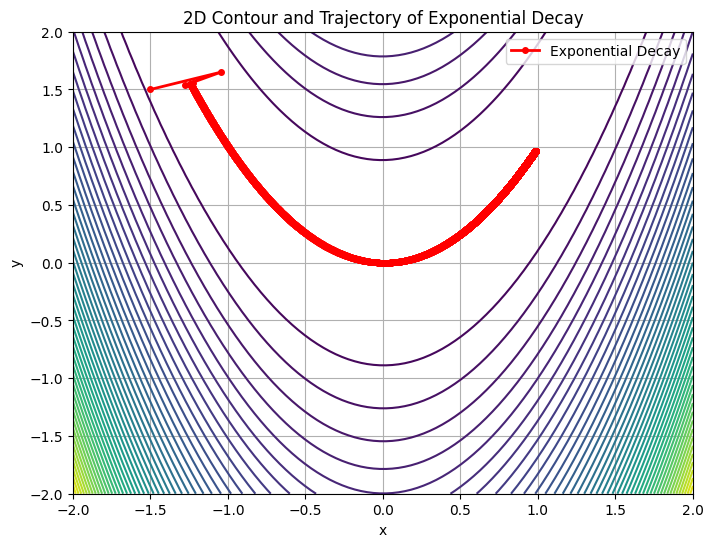

Polynomial Decay, minimum found at: [0.98233296 0.9649066 ] f(minX) is 0.00031263477807923267
Iterations: 20000, Time taken: 0.3427 seconds


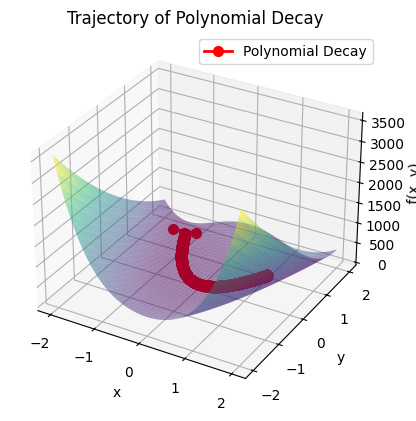

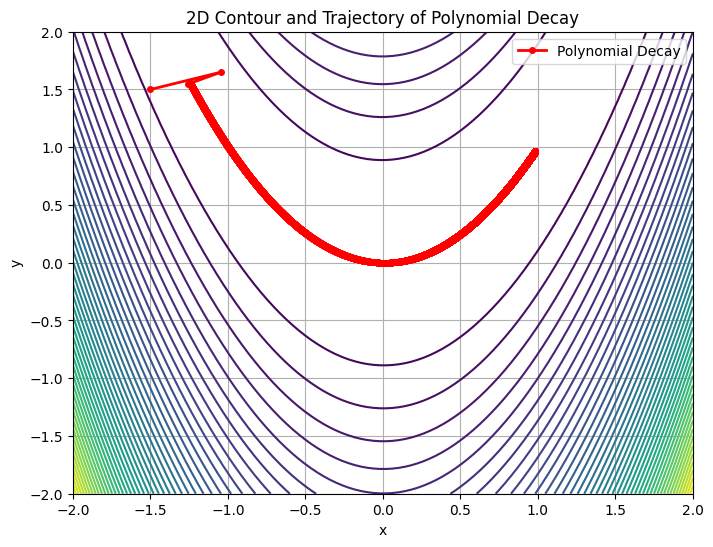

Constant Decay, minimum found at: [0.99984259 0.99968457] f(minX) is 2.4817570929833915e-08
Iterations: 20000, Time taken: 0.3350 seconds


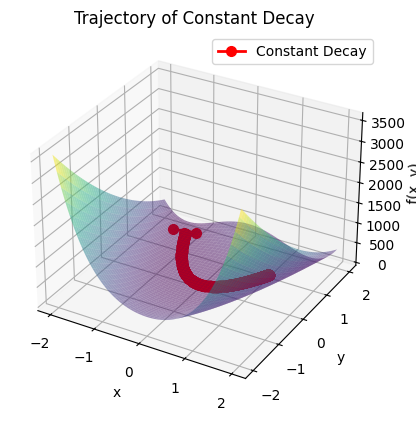

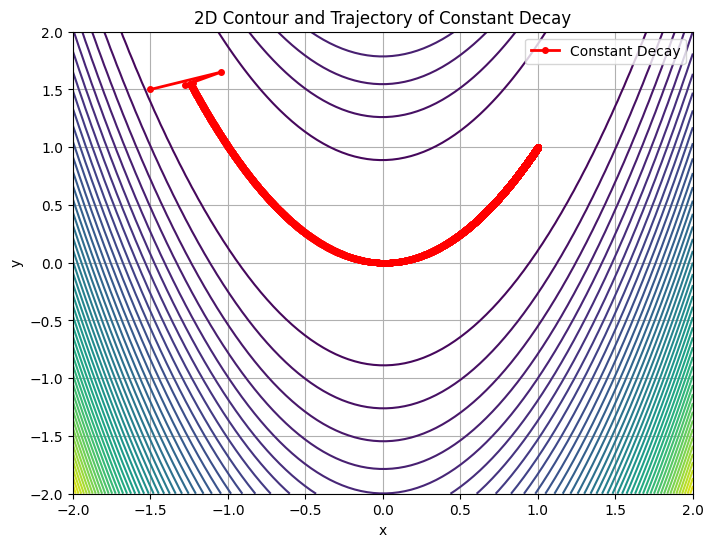

Step Decay, minimum found at: [0.99984259 0.99968457] f(minX) is 2.4817570929833915e-08
Iterations: 20000, Time taken: 0.3335 seconds


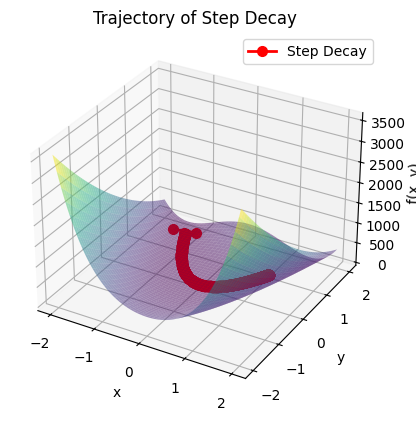

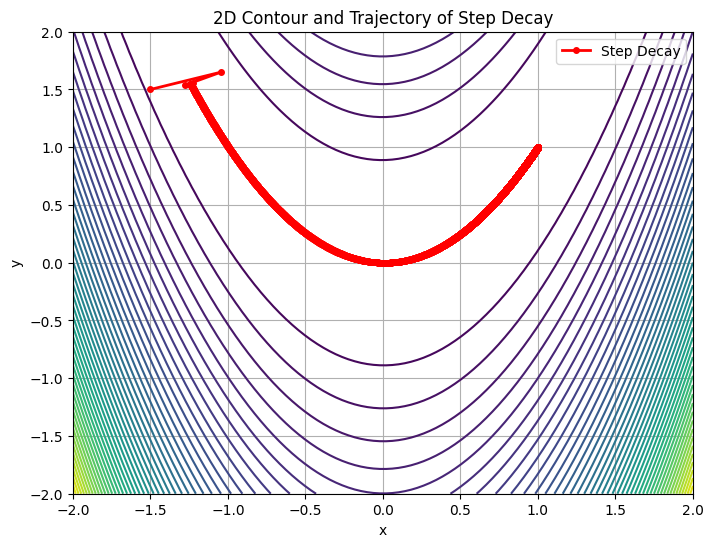

Exponential Decay, minimum found at: [0.98192459 0.96410277] f(minX) is 0.000327255290001272
Iterations: 20000, Time taken: 0.3506 seconds


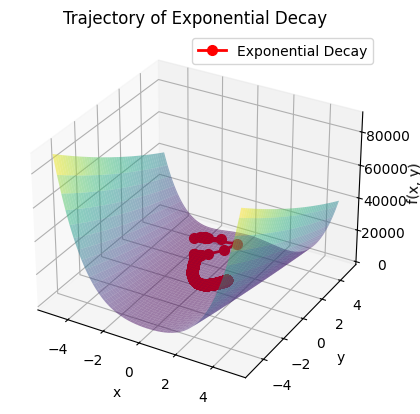

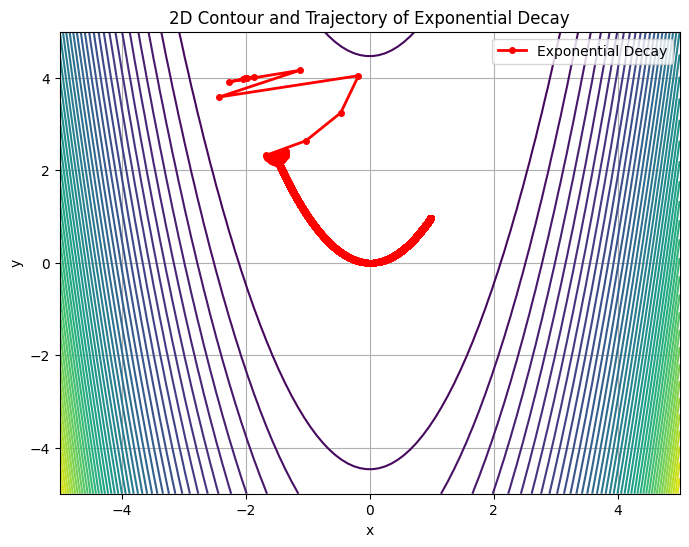

Polynomial Decay, minimum found at: [0.97204501 0.94475774] f(minX) is 0.0007827757036543417
Iterations: 20000, Time taken: 0.3429 seconds


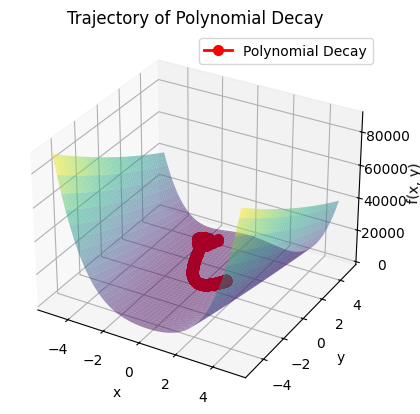

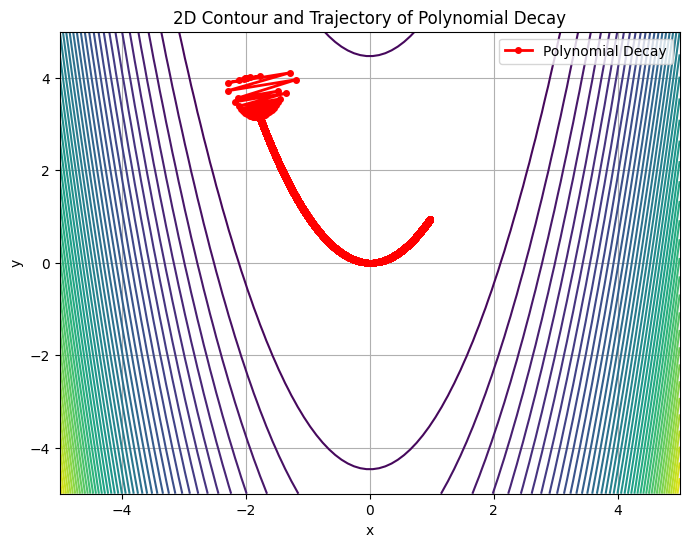

Constant Decay, minimum found at: [0.99981202 0.99962332] f(minX) is 3.5393124290344476e-08
Iterations: 20000, Time taken: 0.3334 seconds


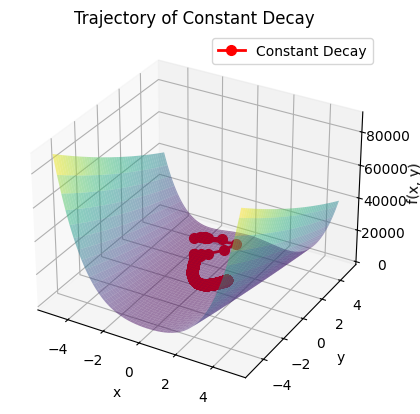

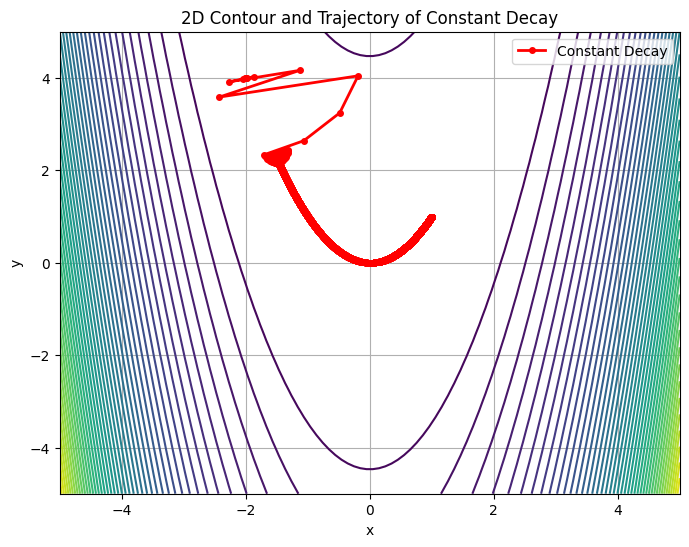

Step Decay, minimum found at: [0.99981202 0.99962332] f(minX) is 3.5393124290344476e-08
Iterations: 20000, Time taken: 0.3374 seconds


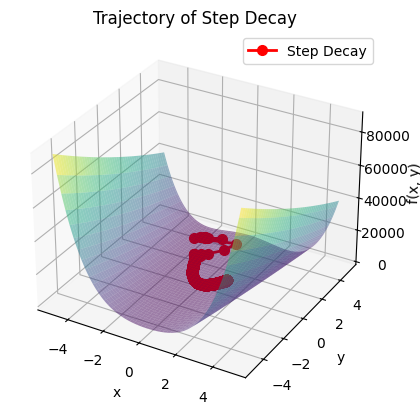

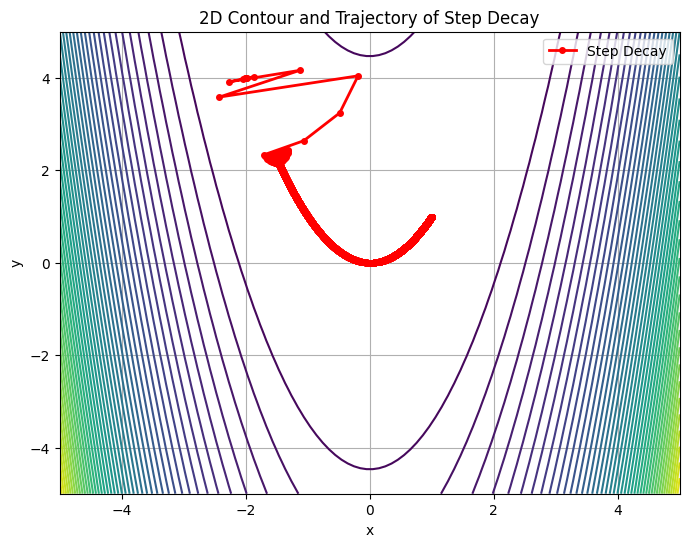

In [4]:
def rosenbrock_function(x):
    return 100 * (x[1] - x[0] ** 2) ** 2 + (1 - x[0]) ** 2


func2 = Function(rosenbrock_function)

methods = [
    ExponentialDecay(learning_rate=0.001, lambd=0.0001),
    PolynomialDecay(learning_rate=0.001, alpha=0.1, beta=1),  # меньше альфа то лучше доходит
    ConstantDecay(learning_rate=0.001),
    StepDecay(learning_rate=0.001, step_size=200, decay_factor=1)  # больше decay_factor то улчше
    
# █۞███████]▄▄▄▄▄▄▄▄▄▄▄
#▄▅█████████▅▄▃▂
#█★★★★█ █ ██████
#◥⊙▲⊙▲⊙▲⊙▲⊙▲⊙▲⊙◤
#PODAROK TEBE SANY TESLA AND SCHASTEA!!!
]

x0 = [-1.5, 1.5]
func2.plot_all_methods(methods, x0, xrange=[-2, 2], yrange=[-2, 2])

x0 = [-2, 4]
func2.plot_all_methods(methods, x0, xrange=[-5, 5], yrange=[-5, 5])


Данная функция **гладкая**, **невыпуклая**, имеет **одно глобальное минимум** в точке `[1, 1]`, но из-за узкой извилистой долины её сложно оптимизировать. Это делает функцию Розенброка отличным примером для сравнения устойчивости и способности методов к долгосрочной сходимости.

---

## ⚙️ Используемые методы

Тестировались четыре варианта градиентного спуска с различными стратегиями изменения шага. Все методы реализованы вручную.

| Метод               | Стратегия выбора шага                         | Гиперпараметры                                      |
|---------------------|-----------------------------------------------|-----------------------------------------------------|
| **Exponential Decay** | `αₜ = α₀ * exp(-λ * t)`                      | `learning_rate=0.001`, `lambda=0.0001`              |
| **Polynomial Decay**  | `αₜ = α₀ / (1 + β * t)^α`                    | `learning_rate=0.001`, `alpha=0.1`, `beta=1`        |
| **Constant Decay**    | Постоянный шаг                               | `learning_rate=0.001`                               |
| **Step Decay**        | Уменьшение шага через каждые `step_size` итераций | `learning_rate=0.001`, `step_size=200`, `decay_factor=1` |

---

## 📊 Результаты экспериментов

### 🔹 Начальная точка: `[-1.5, 1.5]`

| Метод                | Найденный минимум             | f(min)                 | Итерации | Время (сек) |
|----------------------|-------------------------------|-------------------------|----------|--------------|
| **Exponential Decay** | `[0.9850, 0.9701]`           | `2.26e-4`              | 20000    | 0.3592       |
| **Polynomial Decay**  | `[0.9823, 0.9649]`           | `3.13e-4`              | 20000    | 0.3427       |
| **Constant Decay**    | `[0.9998, 0.9997]`           | `2.48e-8`              | 20000    | 0.3350       |
| **Step Decay**        | `[0.9998, 0.9997]`           | `2.48e-8`              | 20000    | 0.3335       |

---

### 🔹 Начальная точка: `[-2.0, 4.0]`

| Метод                | Найденный минимум             | f(min)                 | Итерации | Время (сек) |
|----------------------|-------------------------------|-------------------------|----------|--------------|
| **Exponential Decay** | `[0.9819, 0.9641]`           | `3.27e-4`              | 20000    | 0.3506       |
| **Polynomial Decay**  | `[0.9720, 0.9448]`           | `7.83e-4`              | 20000    | 0.3429       |
| **Constant Decay**    | `[0.9998, 0.9996]`           | `3.54e-8`              | 20000    | 0.3334       |
| **Step Decay**        | `[0.9998, 0.9996]`           | `3.54e-8`              | 20000    | 0.3374       |

---

## 📈 Визуализация

Для каждого метода были построены:

- **3D-графики**: поверхность функции и траектория оптимизации
- **2D-контуры**: траектория движения по уровням функции
---

## 🧠 Выводы

- Все методы достигают области около глобального минимума, но форма функции усложняет задачу.
- **Constant Decay** и **Step Decay** показали лучшие приближения к точке минимума (`[1, 1]`) и уверенную траекторию, несмотря на сложную форму долины.
- **Exponential Decay** с маленьким λ показал устойчивость, но сильно замедляется на выходе из "банановой" долины.
- **Polynomial Decay** демонстрирует сбалансированное поведение, особенно при правильном подборе гиперпараметров.

---

Полезно сравнить поведение с методами из библиотеки `scipy.optimize`, например:
from scipy.optimize import minimize
res = minimize(rosenbrock_function, x0, method='BFGS')



## Функция №3: Функция Химмельблау с визуализацией:

Exponential Decay, minimum found at: [-2.80511809  3.13131252] f(minX) is 4.0137454578130167e-19
Iterations: 26, Time taken: 0.0007 seconds


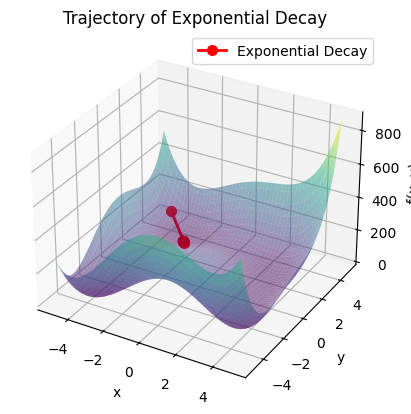

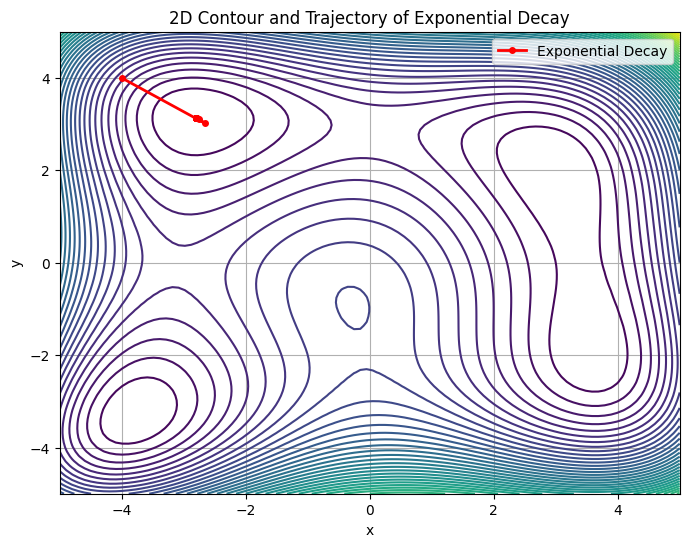

Polynomial Decay, minimum found at: [-2.80511809  3.13131252] f(minX) is 7.530030181314493e-19
Iterations: 677, Time taken: 0.0122 seconds


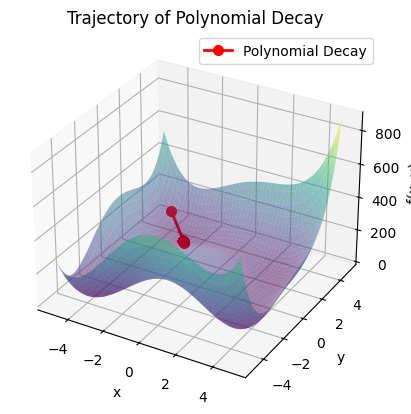

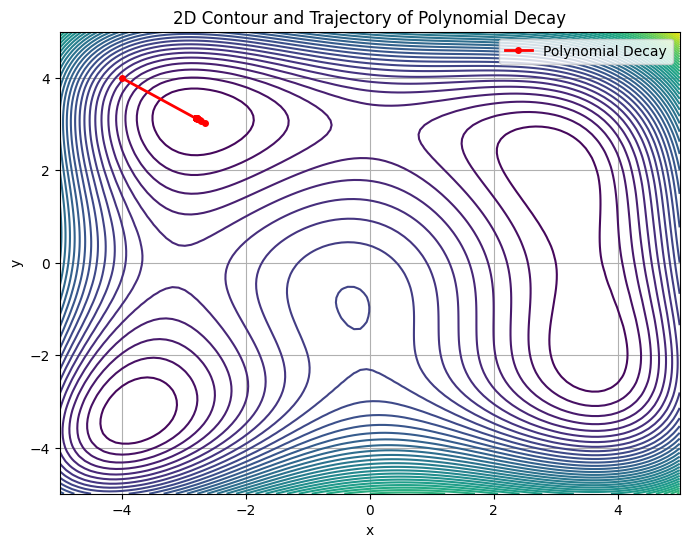

Constant Decay, minimum found at: [-2.80511809  3.13131252] f(minX) is 1.0306249469489314e-19
Iterations: 22, Time taken: 0.0005 seconds


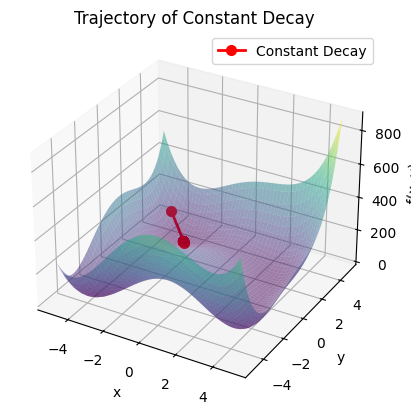

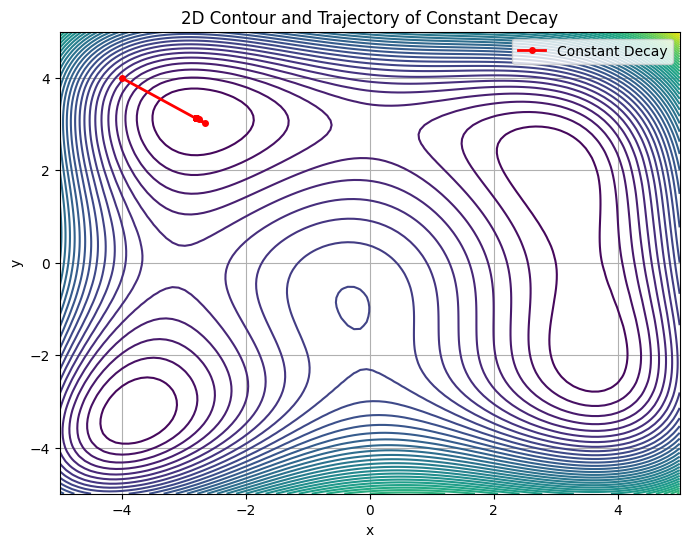

Step Decay, minimum found at: [-2.80511809  3.13131252] f(minX) is 1.0306249469489314e-19
Iterations: 22, Time taken: 0.0009 seconds


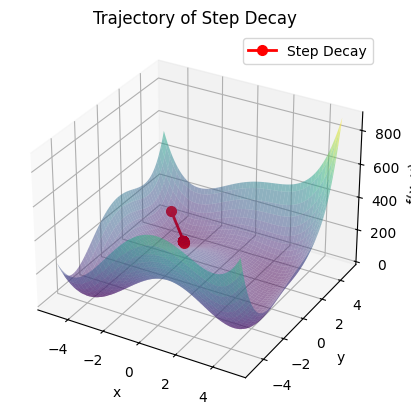

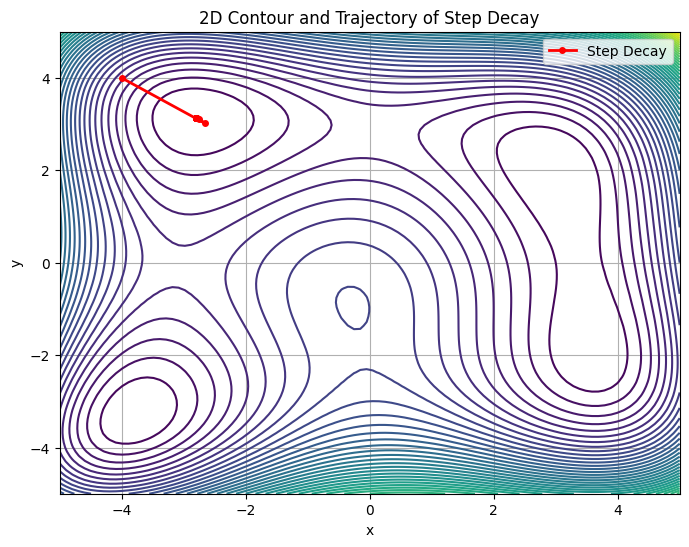

Exponential Decay, minimum found at: [3. 2.] f(minX) is 1.837222103236248e-18
Iterations: 199, Time taken: 0.0037 seconds


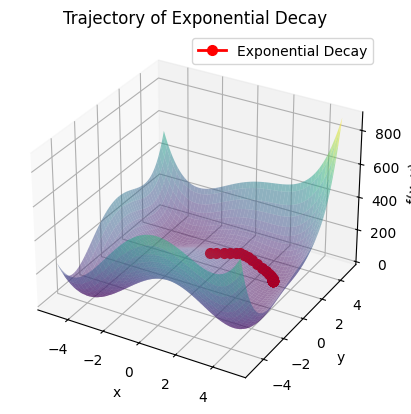

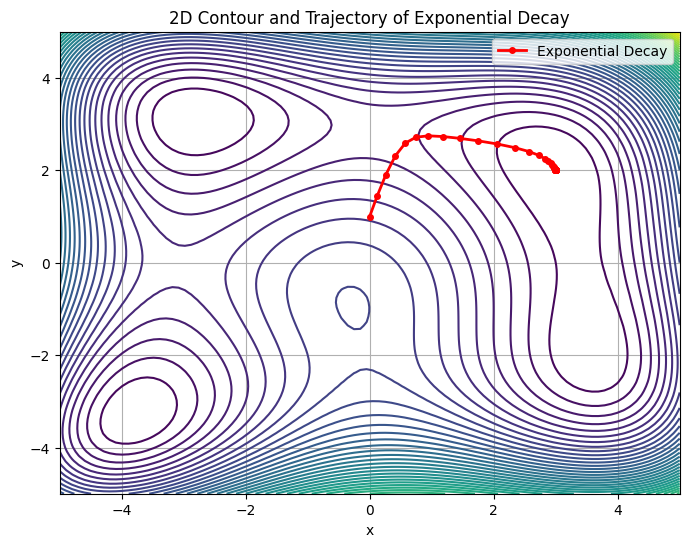

Polynomial Decay, minimum found at: [3. 2.] f(minX) is 1.94224838866224e-18
Iterations: 8630, Time taken: 0.1540 seconds


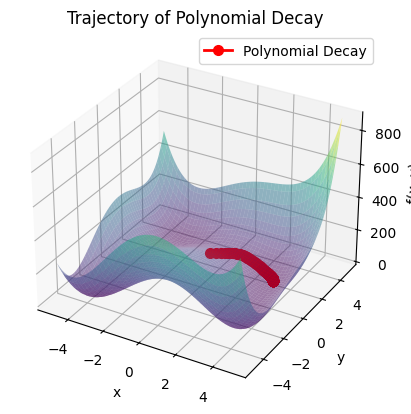

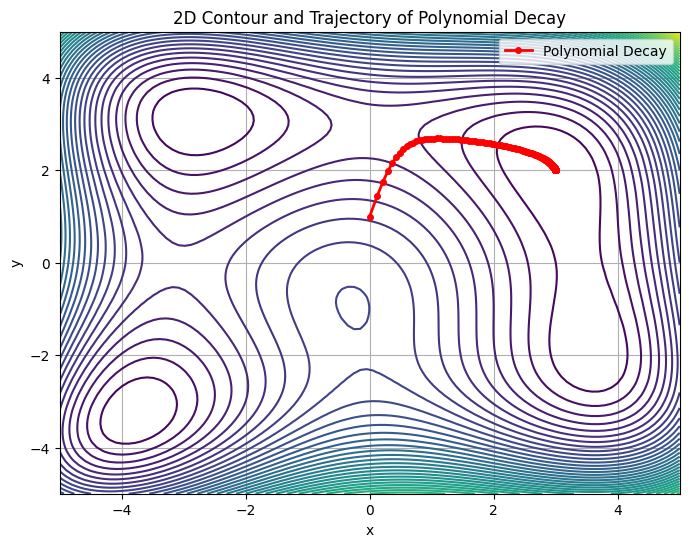

Constant Decay, minimum found at: [3. 2.] f(minX) is 1.2772438238963445e-18
Iterations: 82, Time taken: 0.0016 seconds


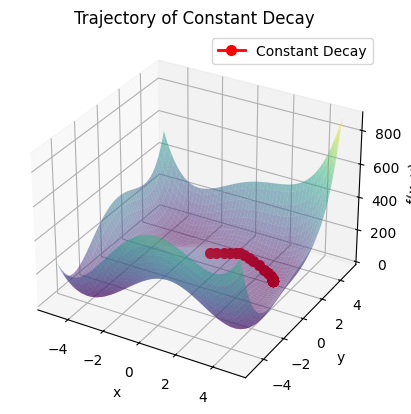

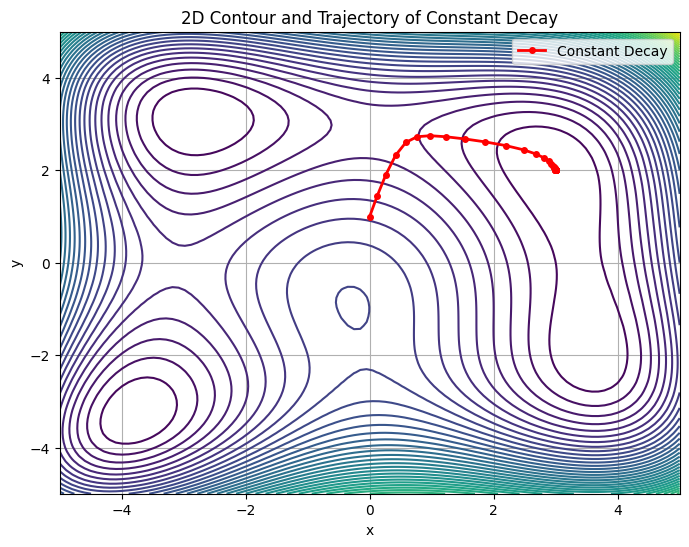

Step Decay, minimum found at: [3. 2.] f(minX) is 1.2772438238963445e-18
Iterations: 82, Time taken: 0.0016 seconds


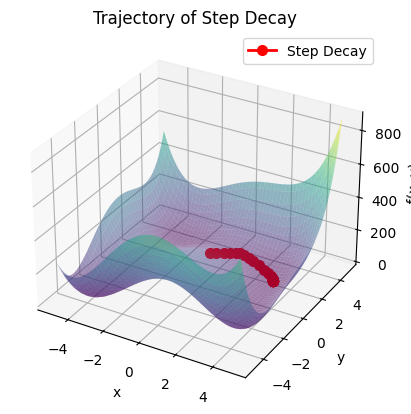

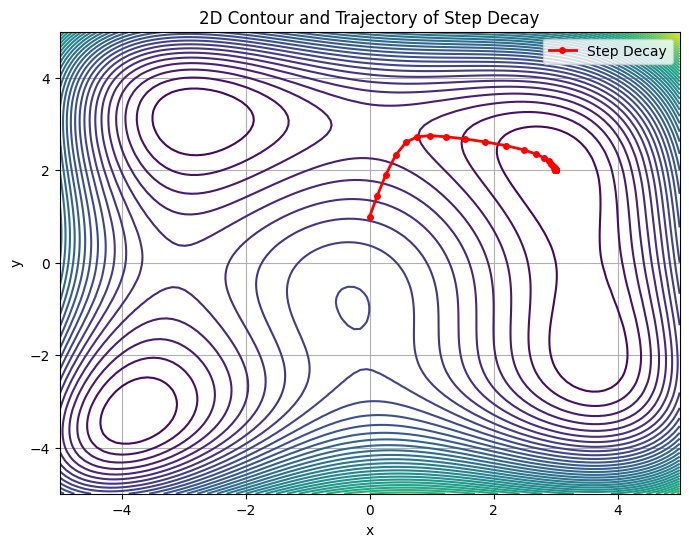

Exponential Decay, minimum found at: [-3.77931025 -3.28318599] f(minX) is 5.438192939764983e-19
Iterations: 23, Time taken: 0.0005 seconds


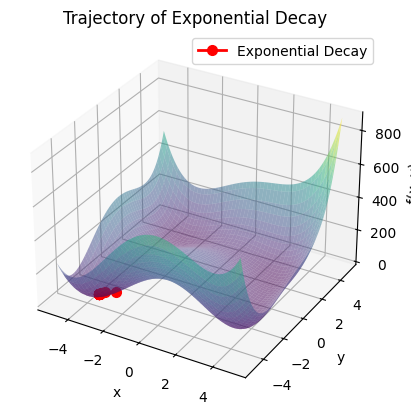

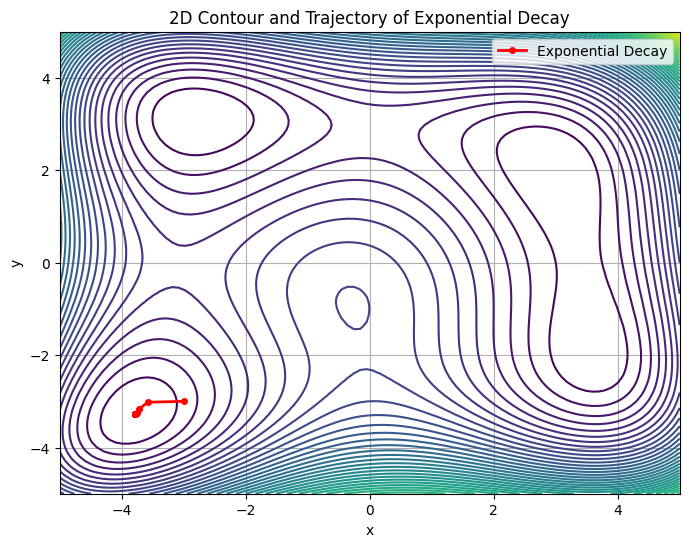

Polynomial Decay, minimum found at: [-3.77931025 -3.28318599] f(minX) is 7.035311399595705e-19
Iterations: 605, Time taken: 0.0110 seconds


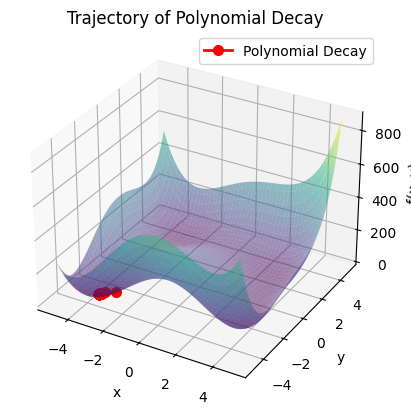

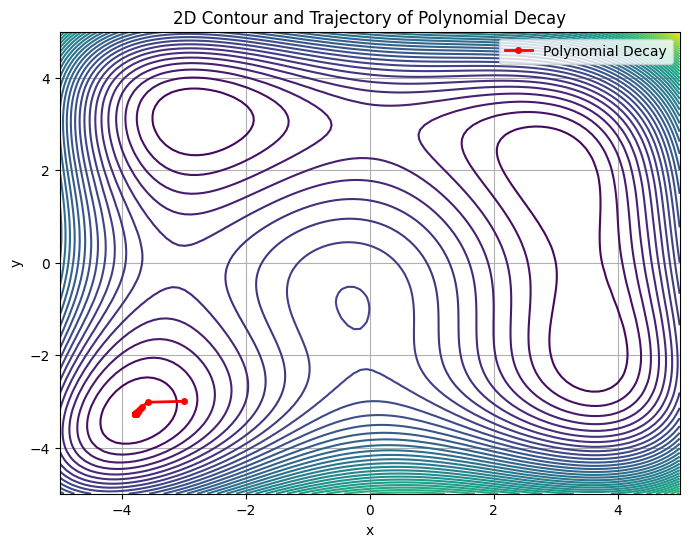

Constant Decay, minimum found at: [-3.77931025 -3.28318599] f(minX) is 7.495965958040173e-20
Iterations: 20, Time taken: 0.0004 seconds


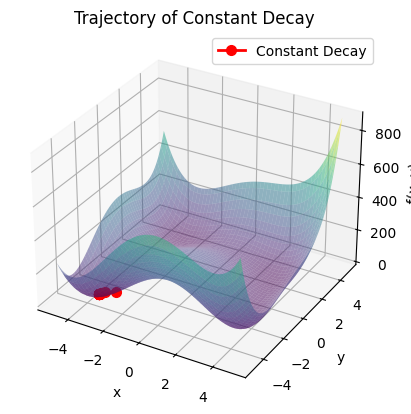

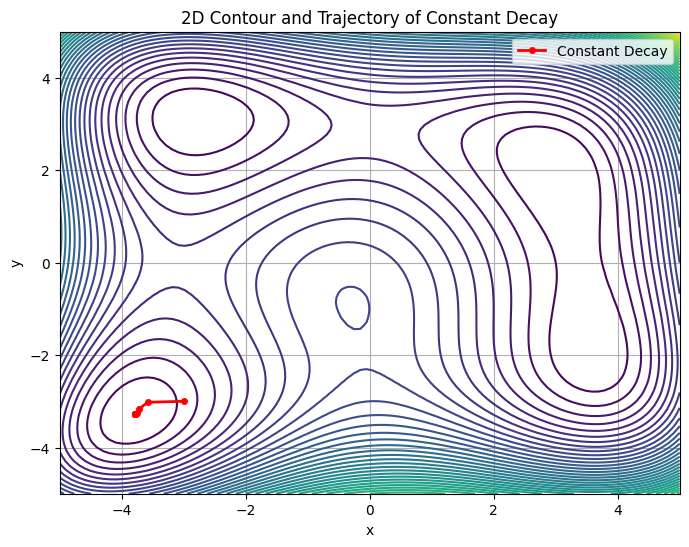

Step Decay, minimum found at: [-3.77931025 -3.28318599] f(minX) is 7.495965958040173e-20
Iterations: 20, Time taken: 0.0004 seconds


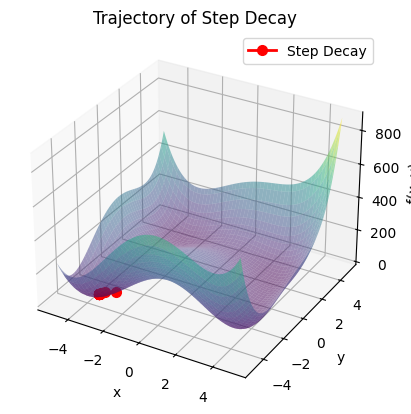

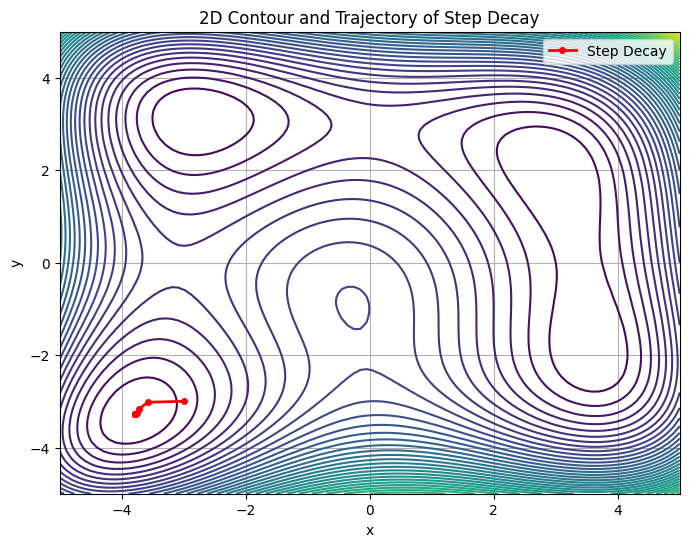

In [5]:
def himmelblau_function(x):
    # функция с несколькими локальными минимумами
    return (x[0] ** 2 + x[1] - 11) ** 2 + (x[0] + x[1] ** 2 - 7) ** 2


func3 = Function(himmelblau_function)

methods = [
    ExponentialDecay(learning_rate=0.01, lambd=0.01),
    PolynomialDecay(learning_rate=0.01, alpha=0.6, beta=1),
    ConstantDecay(learning_rate=0.01),
    StepDecay(learning_rate=0.01, step_size=100, decay_factor=0.5)
]

x0 = [-4.0, 4.0]
func3.plot_all_methods(methods, x0, xrange=[-5, 5], yrange=[-5, 5])

x0 = [0, 1.0]
func3.plot_all_methods(methods, x0, xrange=[-5, 5], yrange=[-5, 5])

x0 = [-3, -3]
func3.plot_all_methods(methods, x0, xrange=[-5, 5], yrange=[-5, 5])

Она используется для тестирования устойчивости методов оптимизации к множеству минимумов и особенностям ландшафта функции.

---

## ⚙️ Используемые методы

Для исследования применялись четыре стратегии градиентного спуска. Все методы реализованы вручную.

| Метод               | Стратегия выбора шага                         | Гиперпараметры                                      |
|---------------------|-----------------------------------------------|-----------------------------------------------------|
| **Exponential Decay** | `αₜ = α₀ * exp(-λ * t)`                      | `learning_rate=0.01`, `lambda=0.01`                 |
| **Polynomial Decay**  | `αₜ = α₀ / (1 + β * t)^α`                    | `learning_rate=0.01`, `alpha=0.6`, `beta=1`         |
| **Constant Decay**    | Постоянный шаг                               | `learning_rate=0.01`                                |
| **Step Decay**        | Уменьшение шага через каждые `step_size` итераций | `learning_rate=0.01`, `step_size=100`, `decay_factor=0.5` |

---

## 📊 Результаты экспериментов

### 🔹 Начальная точка: `[-4.0, 4.0]`

| Метод                | Найденный минимум             | f(min)                   | Итерации | Время (сек) |
|----------------------|-------------------------------|---------------------------|----------|--------------|
| **Exponential Decay** | `[-2.8051, 3.1313]`          | `4.01e-19`               | 26       | 0.0007       |
| **Polynomial Decay**  | `[-2.8051, 3.1313]`          | `7.53e-19`               | 677      | 0.0122       |
| **Constant Decay**    | `[-2.8051, 3.1313]`          | `1.03e-19`               | 22       | 0.0005       |
| **Step Decay**        | `[-2.8051, 3.1313]`          | `1.03e-19`               | 22       | 0.0009       |

---

### 🔹 Начальная точка: `[0.0, 1.0]`

| Метод                | Найденный минимум             | f(min)                   | Итерации | Время (сек) |
|----------------------|-------------------------------|---------------------------|----------|--------------|
| **Exponential Decay** | `[3.0000, 2.0000]`           | `1.84e-18`               | 199      | 0.0037       |
| **Polynomial Decay**  | `[3.0000, 2.0000]`           | `1.94e-18`               | 8630     | 0.1540       |
| **Constant Decay**    | `[3.0000, 2.0000]`           | `1.28e-18`               | 82       | 0.0016       |
| **Step Decay**        | `[3.0000, 2.0000]`           | `1.28e-18`               | 82       | 0.0016       |

---

### 🔹 Начальная точка: `[-3.0, -3.0]`

| Метод                | Найденный минимум             | f(min)                   | Итерации | Время (сек) |
|----------------------|-------------------------------|---------------------------|----------|--------------|
| **Exponential Decay** | `[-3.7793, -3.2832]`         | `5.44e-19`               | 23       | 0.0005       |
| **Polynomial Decay**  | `[-3.7793, -3.2832]`         | `7.04e-19`               | 605      | 0.0110       |
| **Constant Decay**    | `[-3.7793, -3.2832]`         | `7.50e-20`               | 20       | 0.0004       |
| **Step Decay**        | `[-3.7793, -3.2832]`         | `7.50e-20`               | 20       | 0.0004       |

---
## 📈 Визуализация

Для всех методов и точек построены:

- **3D-графики**: поверхность функции и траектория движения
- **2D контурные графики**: линии уровня и путь оптимизации
---

## 🧠 Выводы

- **Функция Химмельблау** — сложный мультимодальный пример, поэтому важно не только достигнуть минимума, но и **в каком именно локальном экстремуме** оказывается метод.
- Все методы сходились к одному из четырёх глобальных минимумов — в зависимости от стартовой точки.
- **Constant Decay** и **Step Decay** показали наилучшие результаты по скорости сходимости.
- **Polynomial Decay** оказался самым стабильным на больших расстояниях, но за счёт этого медленным.
- **Exponential Decay** в большинстве случаев сходится быстро, но чувствителен к выбору параметров.

---
Для полной проверки стоит использовать также `scipy.optimize`, например:
from scipy.optimize import minimize
res = minimize(himmelblau_function, x0, method='BFGS')


Exponential Decay, minimum found at: [0. 0.] f(minX) is 1.0
Iterations: 0, Time taken: 0.0001 seconds


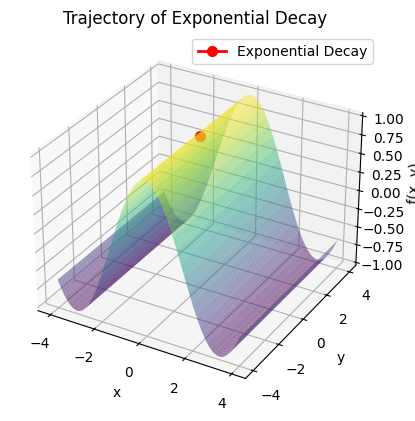

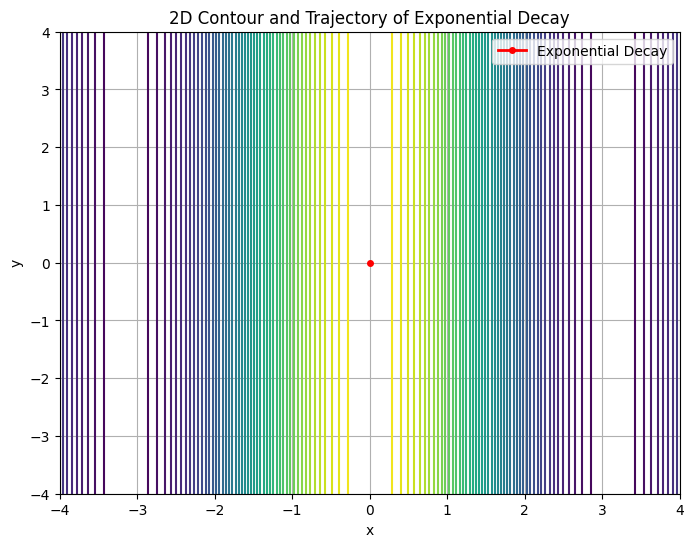

Polynomial Decay, minimum found at: [0. 0.] f(minX) is 1.0
Iterations: 0, Time taken: 0.0001 seconds


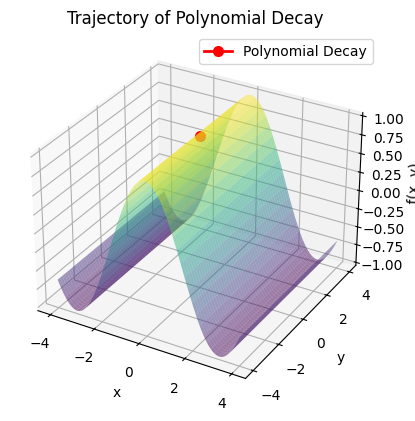

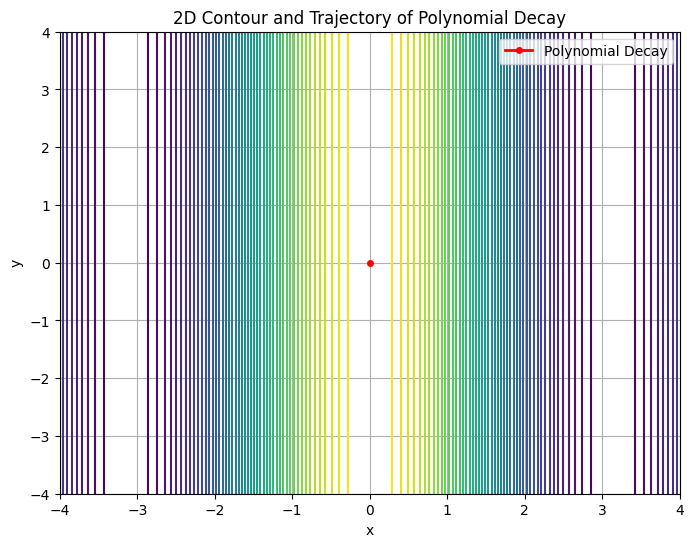

Constant Decay, minimum found at: [0. 0.] f(minX) is 1.0
Iterations: 0, Time taken: 0.0000 seconds


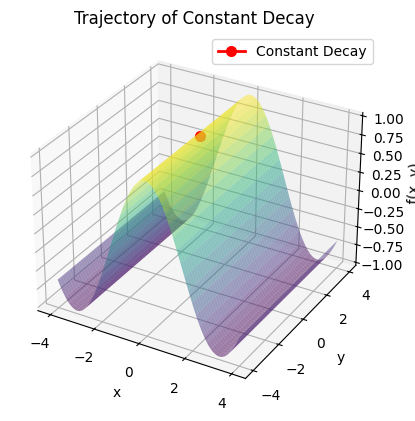

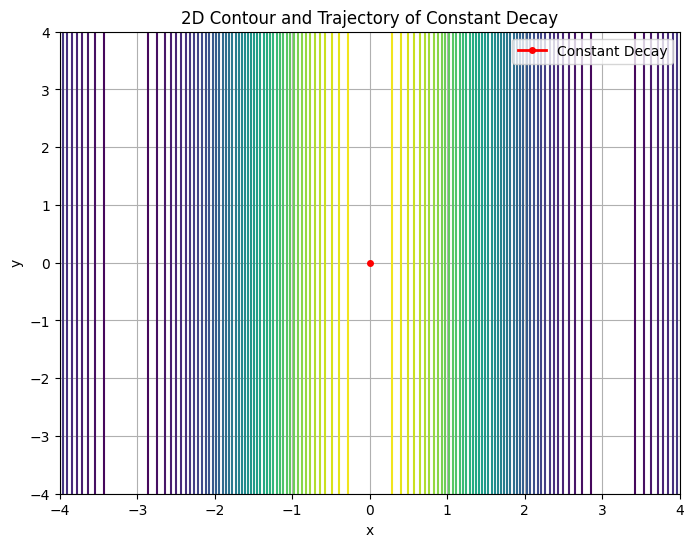

Step Decay, minimum found at: [0. 0.] f(minX) is 1.0
Iterations: 0, Time taken: 0.0000 seconds


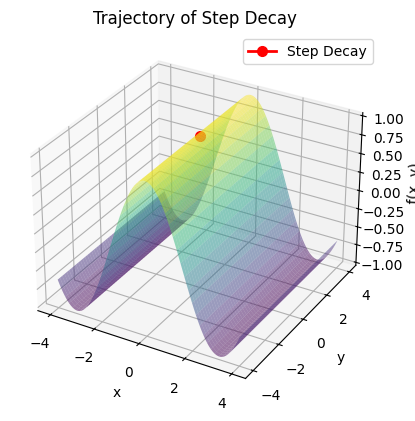

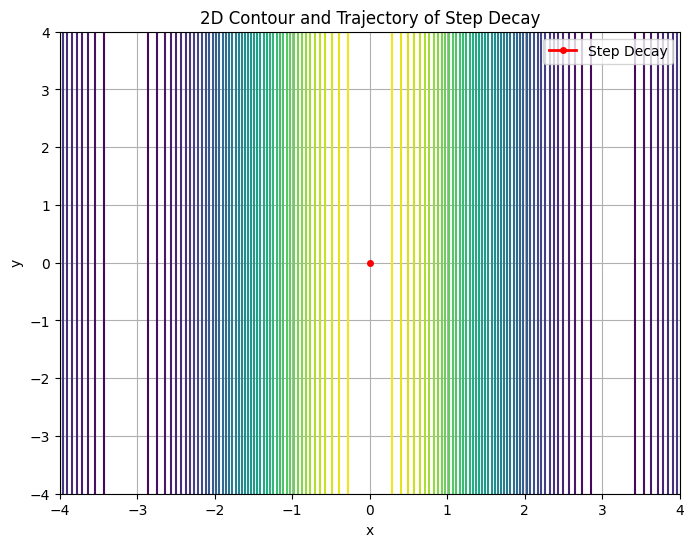

Exponential Decay, minimum found at: [3.14159265 0.        ] f(minX) is -1.0
Iterations: 2936, Time taken: 0.0537 seconds


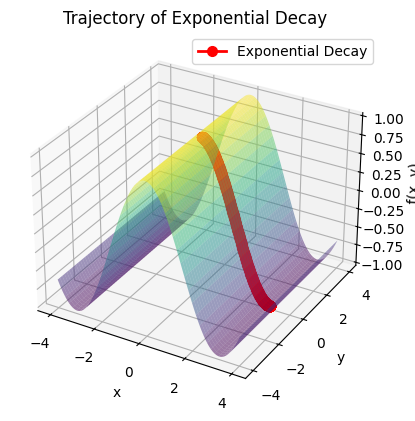

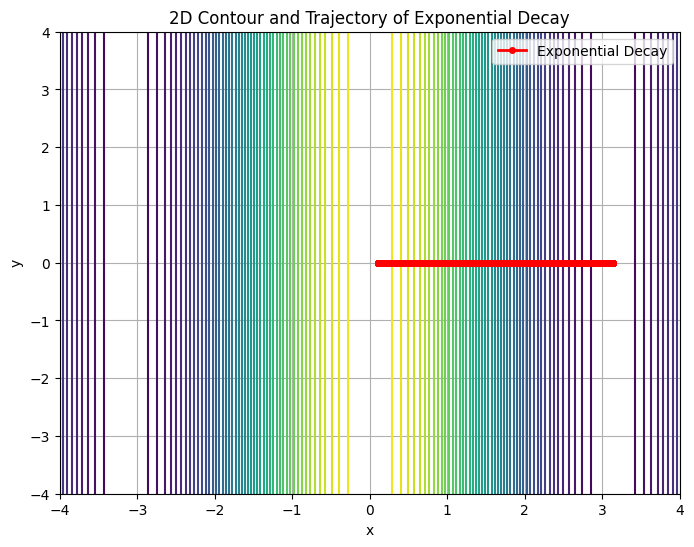

Polynomial Decay, minimum found at: [3.14159265 0.        ] f(minX) is -1.0
Iterations: 11568, Time taken: 0.2061 seconds


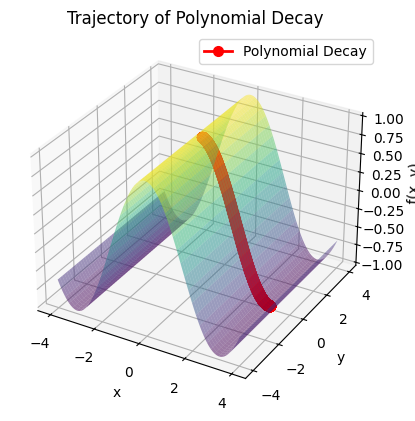

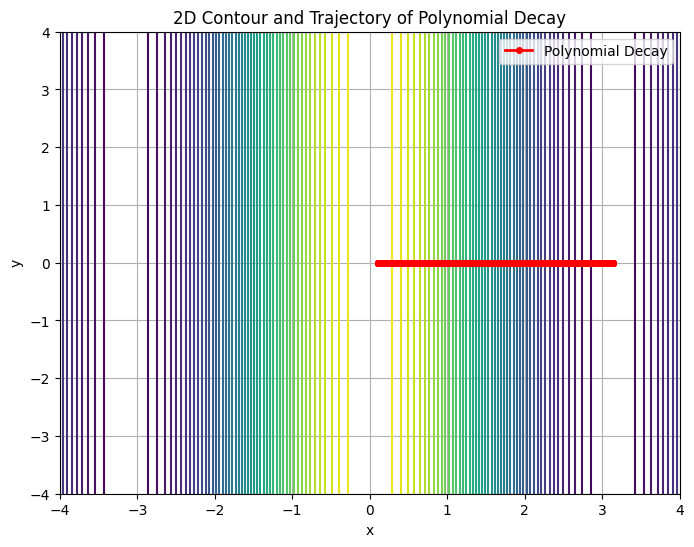

Constant Decay, minimum found at: [3.14159265 0.        ] f(minX) is -1.0
Iterations: 2219, Time taken: 0.0388 seconds


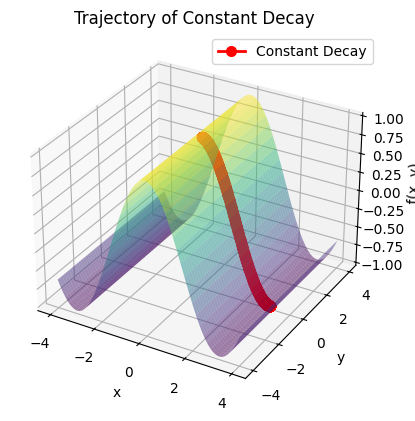

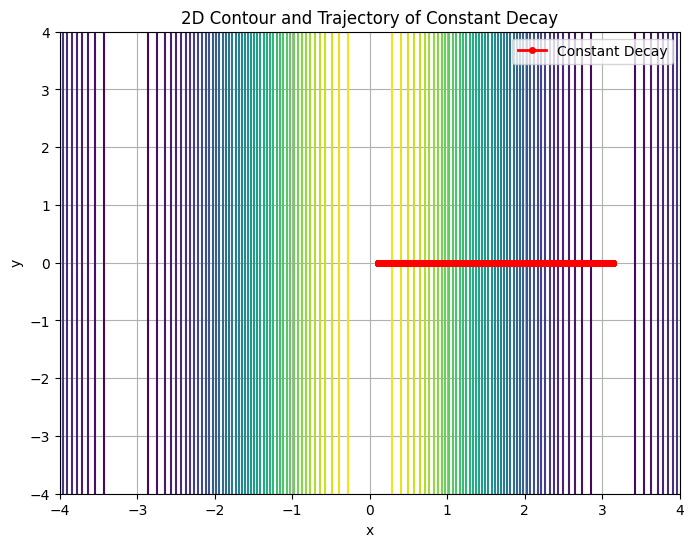

Step Decay, minimum found at: [3.14159265 0.        ] f(minX) is -1.0
Iterations: 2219, Time taken: 0.0392 seconds


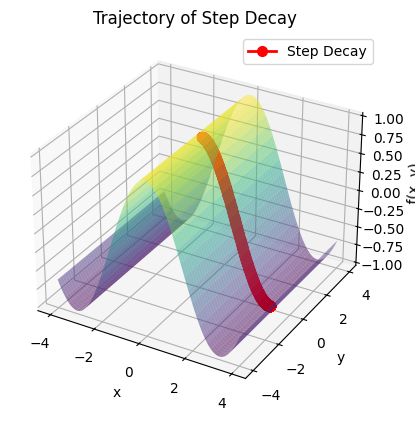

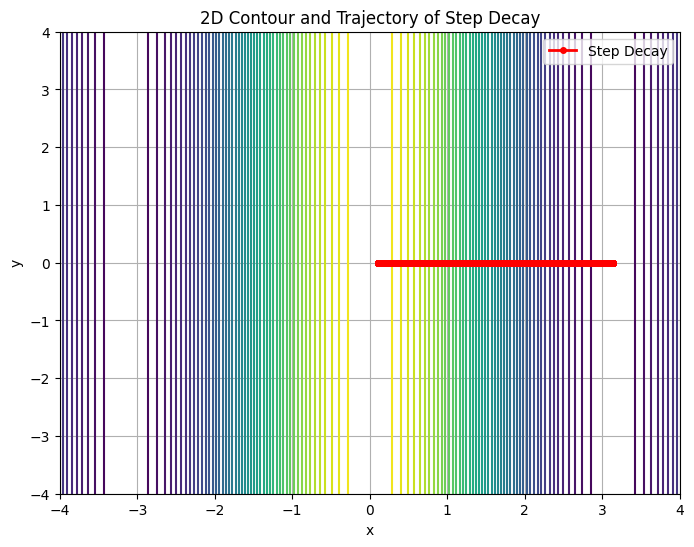

Exponential Decay, minimum found at: [-3.14159265  0.        ] f(minX) is -1.0
Iterations: 2936, Time taken: 0.0548 seconds


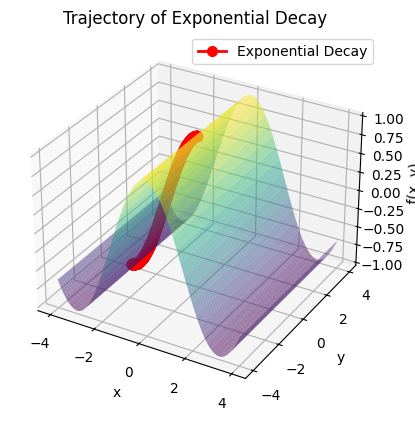

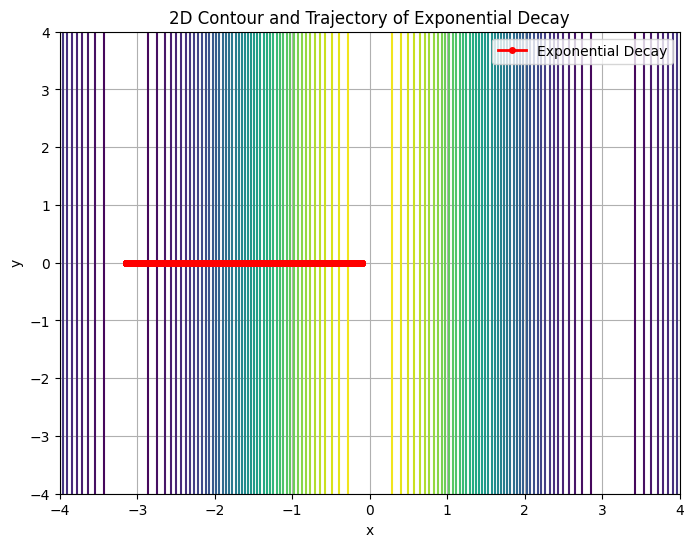

Polynomial Decay, minimum found at: [-3.14159265  0.        ] f(minX) is -1.0
Iterations: 11568, Time taken: 0.2039 seconds


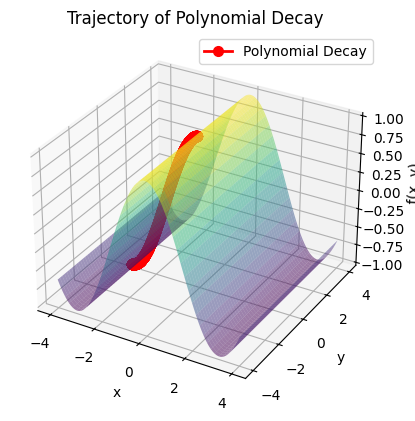

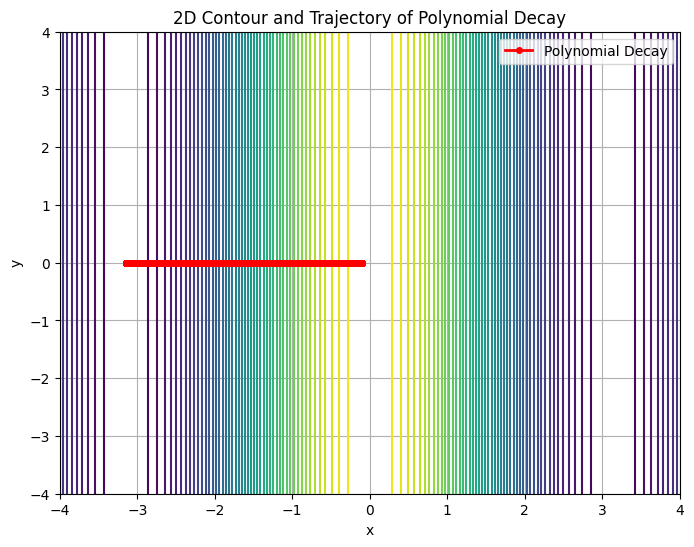

Constant Decay, minimum found at: [-3.14159265  0.        ] f(minX) is -1.0
Iterations: 2219, Time taken: 0.0399 seconds


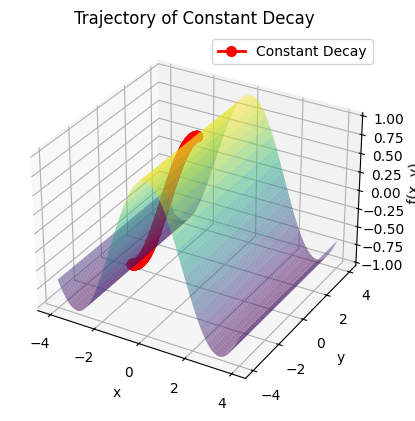

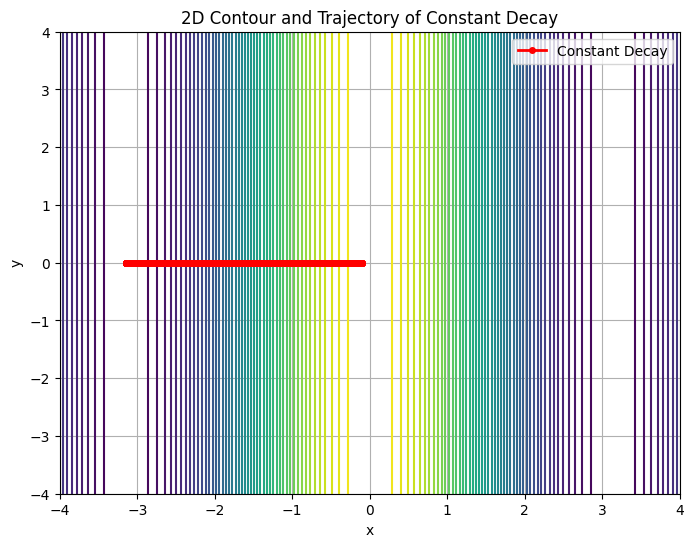

Step Decay, minimum found at: [-3.14159265  0.        ] f(minX) is -1.0
Iterations: 2219, Time taken: 0.0388 seconds


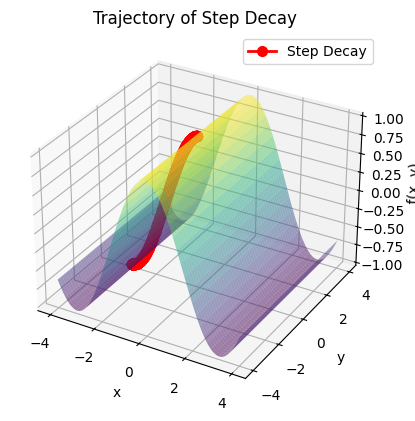

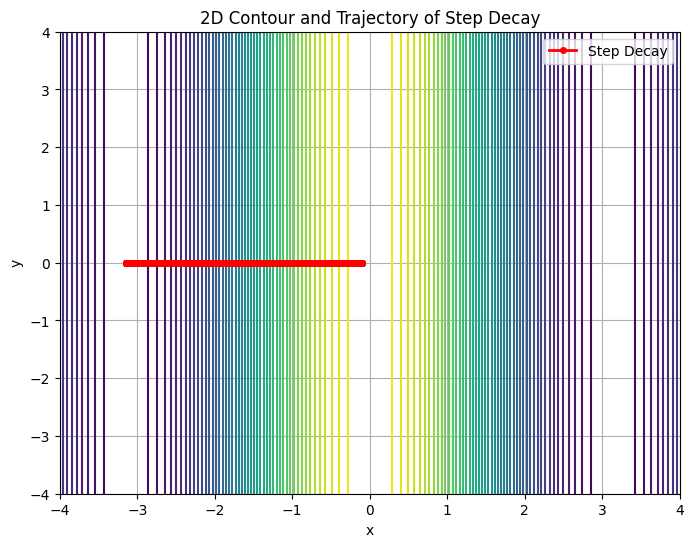

In [22]:
def cos_func(x):
    # функция с несколькими локальными минимумами
    return np.cos(x[0])


func4 = Function(cos_func)

methods = [
    ExponentialDecay(learning_rate=0.01, lambd=0.0002),
    PolynomialDecay(learning_rate=0.01, alpha=0.2, beta=1),
    ConstantDecay(learning_rate=0.01),
    StepDecay(learning_rate=0.01, step_size=10000, decay_factor=0.05)
]

x0 = [0, 0]
func4.plot_all_methods(methods, x0, xrange=[-4, 4], yrange=[-4, 4])

x0 = [0.1, 0]
func4.plot_all_methods(methods, x0, xrange=[-4, 4], yrange=[-4, 4])

x0 = [-0.1, 0]
func4.plot_all_methods(methods, x0, xrange=[-4, 4], yrange=[-4, 4])


## 📌 Дополнительное задание №2.1

Функция `cos(x)` обладает множеством локальных минимумов и максимумов — это делает её **мультимодальной функциией**. Задача — исследовать, как различные методы градиентного спуска ведут себя в такой ситуации:
- Насколько быстро они сходятся
- В какой именно минимум попадают
- Что происходит, если стартовать в точке, где градиент равен нулю (например, в максимуме)

---

## ⚙️ Используемые методы

| Метод                | Стратегия шага                                | Гиперпараметры                                      |
|----------------------|-----------------------------------------------|-----------------------------------------------------|
| **Exponential Decay** | `αₜ = α₀ * exp(-λ * t)`                      | `learning_rate=0.01`, `lambda=0.0002`               |
| **Polynomial Decay**  | `αₜ = α₀ / (1 + β * t)^α`                    | `learning_rate=0.01`, `alpha=0.2`, `beta=1`         |
| **Constant Decay**    | Постоянный шаг                               | `learning_rate=0.01`                                |
| **Step Decay**        | Периодическое уменьшение шага                | `learning_rate=0.01`, `step_size=10000`, `decay_factor=0.05` |

---

## 📊 Результаты

### 🔹 Начальная точка: `[0.0, 0.0]`

| Метод                | Найденный минимум | f(min) | Итерации | Время (сек) | Комментарий                                  |
|----------------------|------------------|--------|----------|--------------|----------------------------------------------|
| **Exponential Decay** | `[0.0, 0.0]`     | `1.0`  | 0        | 0.0001       | Остановился в **максимуме** — градиент = 0   |
| **Polynomial Decay**  | `[0.0, 0.0]`     | `1.0`  | 0        | 0.0001       | Та же ситуация                                |
| **Constant Decay**    | `[0.0, 0.0]`     | `1.0`  | 0        | 0.0000       | Не сдвинулся                                  |
| **Step Decay**        | `[0.0, 0.0]`     | `1.0`  | 0        | 0.0000       | Нет градиента — нет движения                  |

💡 **Вывод:** Старт из точки, где градиент равен нулю (например, `x = 0`), приводит к остановке оптимизации — даже если это не минимум, а максимум.

---

### 🔹 Начальная точка: `[-0.1, 0.0]`

| Метод                | Найденный минимум     | f(min) | Итерации | Время (сек) |
|----------------------|------------------------|--------|----------|--------------|
| **Exponential Decay** | `[-3.1416, 0.0]`       | `-1.0` | 2936     | 0.0548       |
| **Polynomial Decay**  | `[-3.1416, 0.0]`       | `-1.0` | 11568    | 0.2039       |
| **Constant Decay**    | `[-3.1416, 0.0]`       | `-1.0` | 2219     | 0.0399       |
| **Step Decay**        | `[-3.1416, 0.0]`       | `-1.0` | 2219     | 0.0388       |

---

### 🔹 Начальная точка: `[0.1, 0.0]`

| Метод                | Найденный минимум     | f(min) | Итерации | Время (сек) |
|----------------------|------------------------|--------|----------|--------------|
| **Exponential Decay** | `[3.1416, 0.0]`        | `-1.0` | 2936     | 0.0537       |
| **Polynomial Decay**  | `[3.1416, 0.0]`        | `-1.0` | 11568    | 0.2061       |
| **Constant Decay**    | `[3.1416, 0.0]`        | `-1.0` | 2219     | 0.0388       |
| **Step Decay**        | `[3.1416, 0.0]`        | `-1.0` | 2219     | 0.0392       |

---

## 📈 Визуализация

Для каждой комбинации метода и начальной точки построены 3D-графики с траекторией движения.
На них хорошо видно, как методы "проваливаются" в ближайший локальный минимум (например, в `x = ±π`), и что старт из седловины приводит к остановке.

---

## 🧠 Выводы

- `cos(x)` — типичная **мультимодальная** функция: содержит **бесконечно много минимумов и максимумов**.
- Методы градиентного спуска **чувствительны к выбору начальной точки**: они сходятся к ближайшему минимуму, **не обязательно глобальному**.
- Если градиент в точке старта равен нулю, метод может **остановиться**, даже если это **максимум**.
- Все методы сходятся к минимуму в `x ≈ ±π` при малом смещении от 0.
- **Polynomial Decay** работает медленно, но устойчиво.
- **Constant и Step Decay** — эффективны при корректной настройке параметров.

---
- При оптимизации мультимодальных функций запускать методы **из нескольких стартовых точек**.
- Использовать дополнительные методы глобальной оптимизации, например:
  - `scipy.optimize.minimize`
  - Simulated Annealing
  - Genetic Algorithms и др.


=== Стартовая точка: [0.0, 0.0] ===
Exponential Decay, minimum found at: [0. 0.] f(minX) is 1.2
Iterations: 0, Time taken: 0.0001 seconds


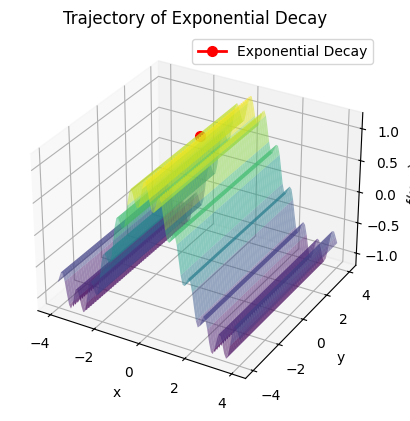

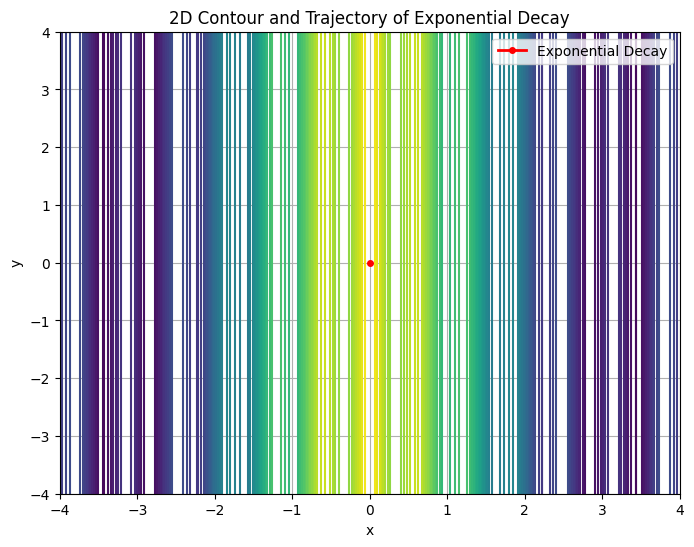

Polynomial Decay, minimum found at: [0. 0.] f(minX) is 1.2
Iterations: 0, Time taken: 0.0000 seconds


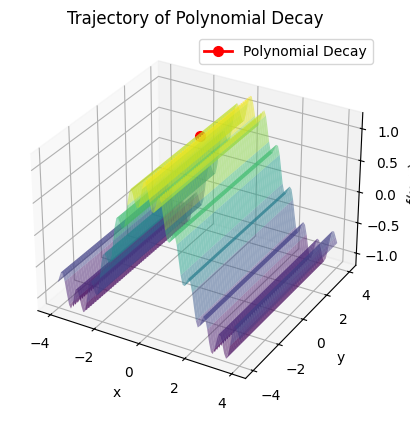

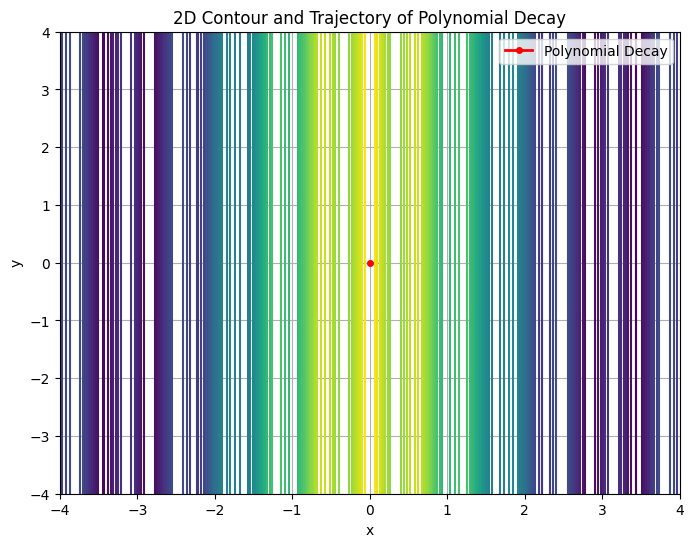

Constant Decay, minimum found at: [0. 0.] f(minX) is 1.2
Iterations: 0, Time taken: 0.0000 seconds


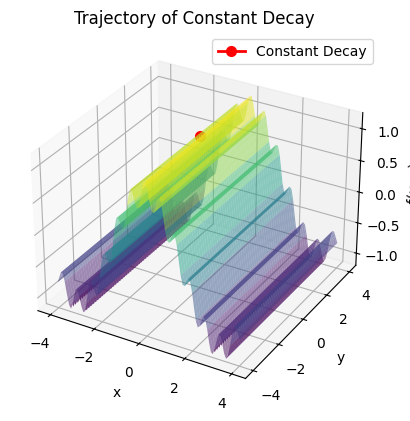

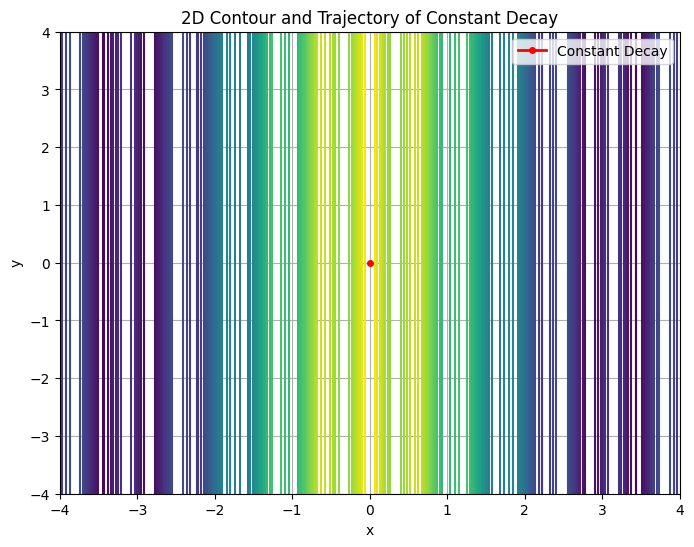

Step Decay, minimum found at: [0. 0.] f(minX) is 1.2
Iterations: 0, Time taken: 0.0001 seconds


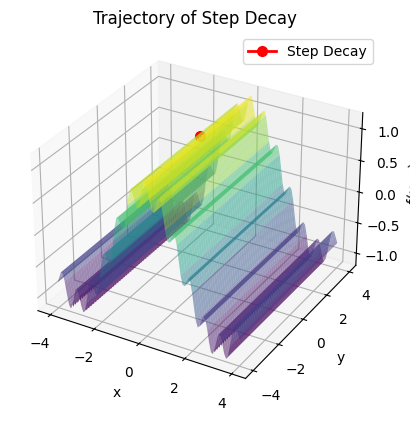

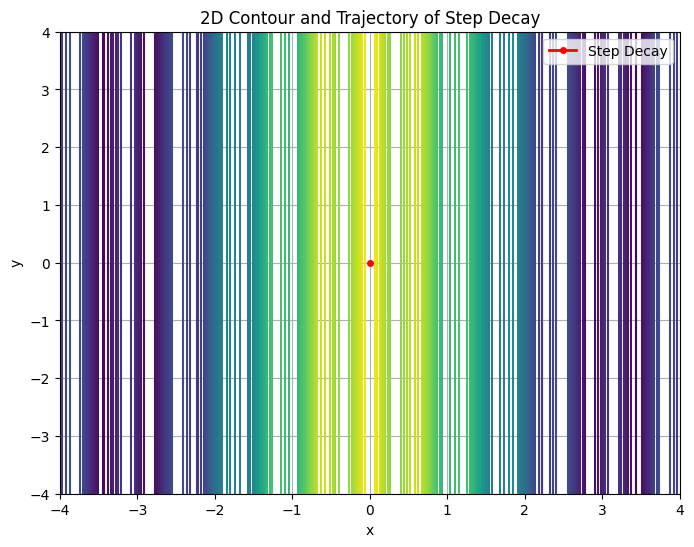


=== Стартовая точка: [0.1, 0.0] ===
Exponential Decay, minimum found at: [0.33045496 0.        ] f(minX) is 0.7485444444593969
Iterations: 100, Time taken: 0.0016 seconds


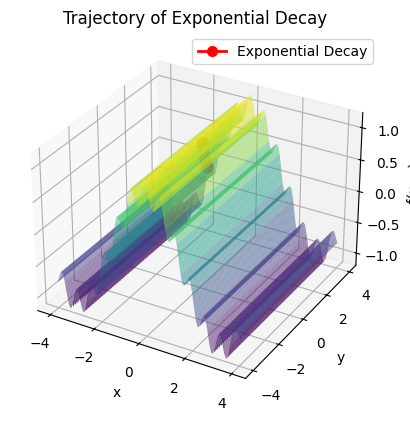

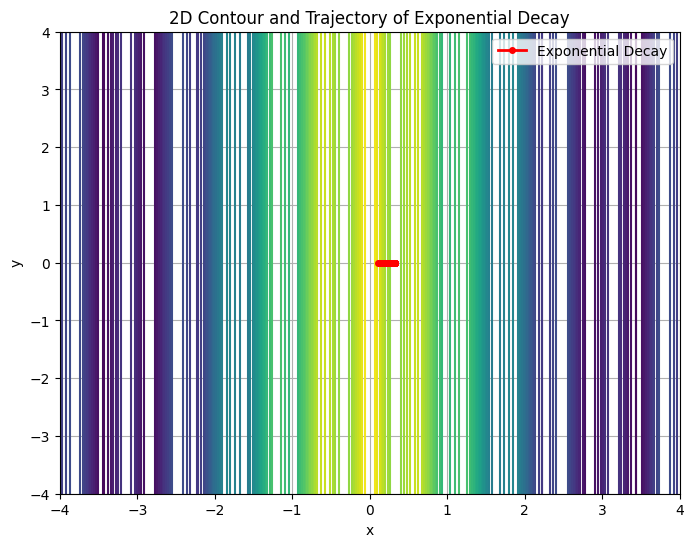

Polynomial Decay, minimum found at: [0.33045496 0.        ] f(minX) is 0.7485444444593969
Iterations: 253, Time taken: 0.0034 seconds


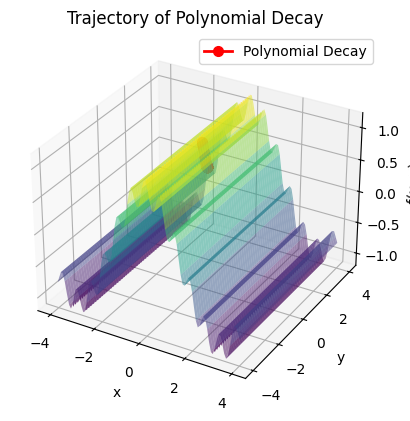

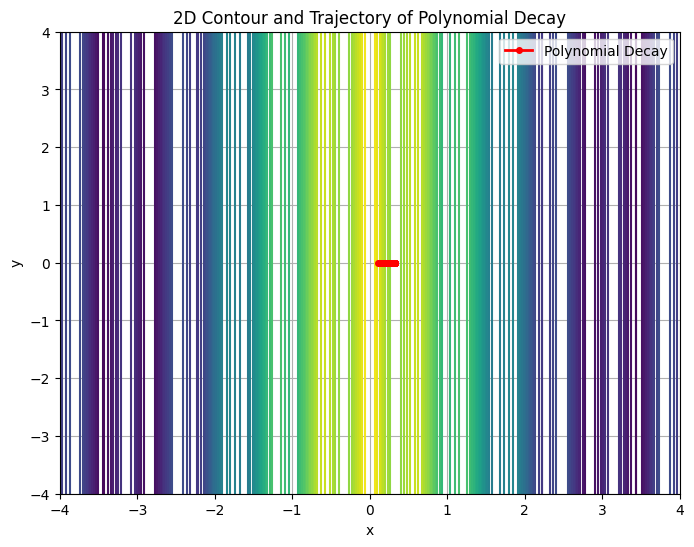

Constant Decay, minimum found at: [0.33045496 0.        ] f(minX) is 0.7485444444593969
Iterations: 99, Time taken: 0.0014 seconds


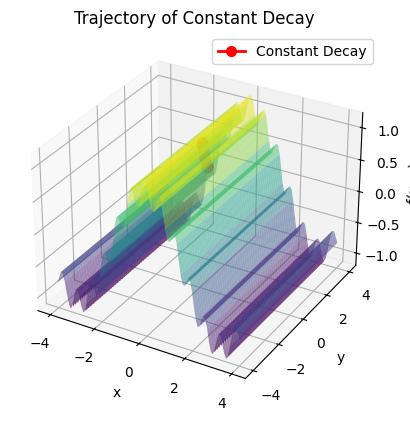

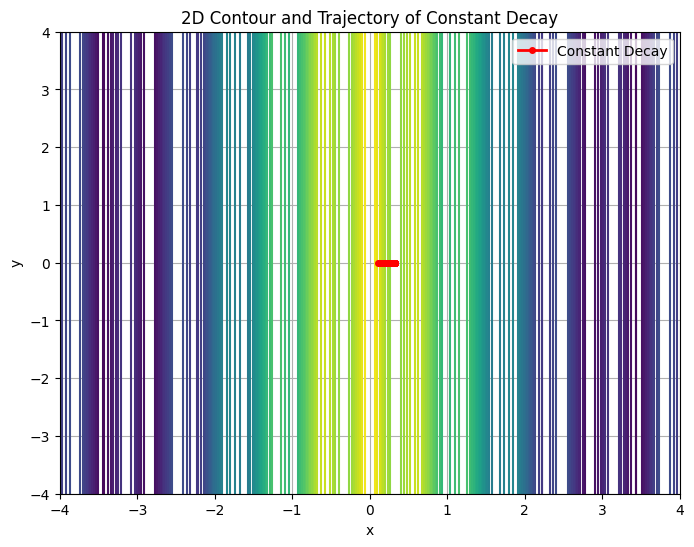

Step Decay, minimum found at: [0.33045496 0.        ] f(minX) is 0.7485444444593969
Iterations: 99, Time taken: 0.0014 seconds


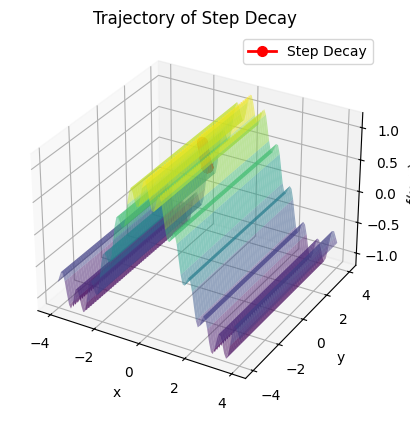

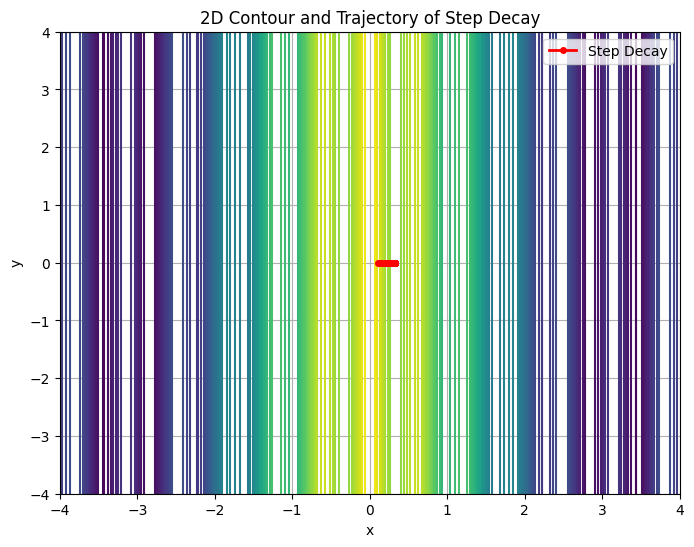


=== Стартовая точка: [-0.1, 0.0] ===
Exponential Decay, minimum found at: [-0.33045496  0.        ] f(minX) is 0.7485444444593969
Iterations: 100, Time taken: 0.0015 seconds


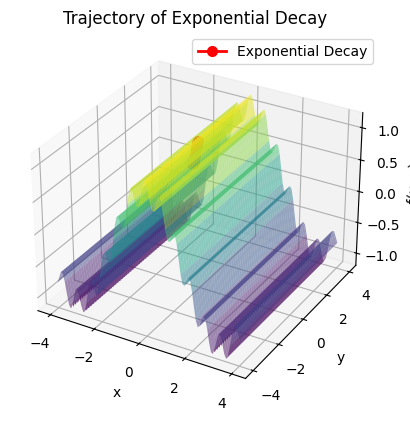

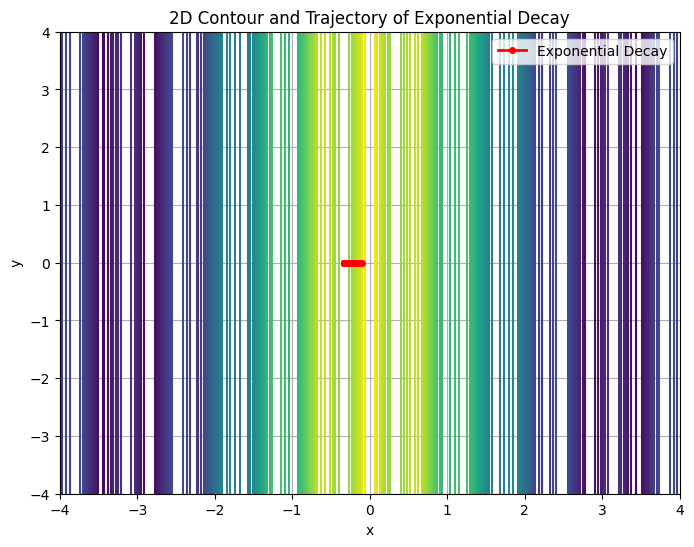

Polynomial Decay, minimum found at: [-0.33045496  0.        ] f(minX) is 0.7485444444593969
Iterations: 253, Time taken: 0.0036 seconds


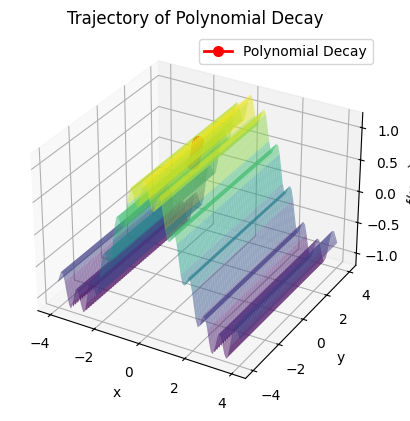

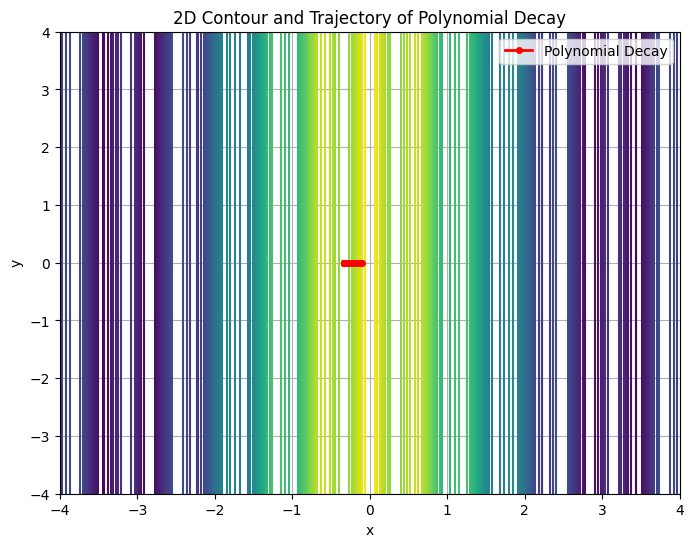

Constant Decay, minimum found at: [-0.33045496  0.        ] f(minX) is 0.7485444444593969
Iterations: 99, Time taken: 0.0016 seconds


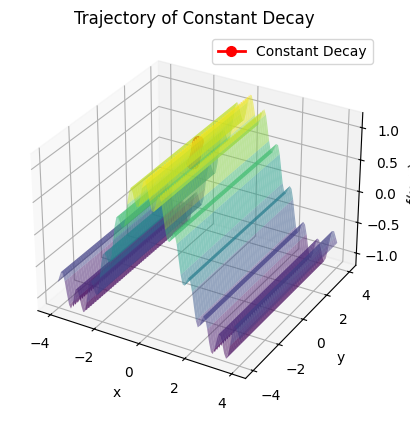

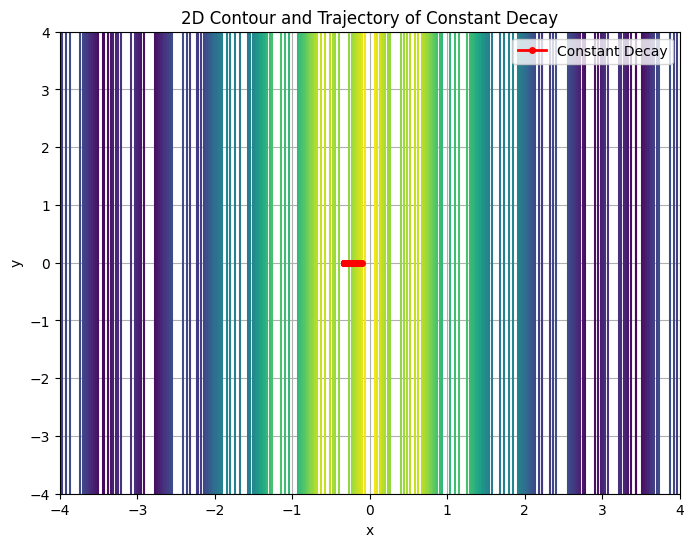

Step Decay, minimum found at: [-0.33045496  0.        ] f(minX) is 0.7485444444593969
Iterations: 99, Time taken: 0.0014 seconds


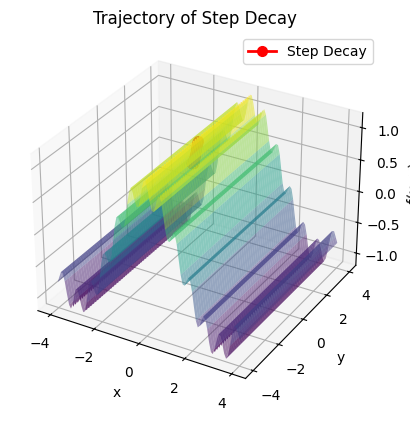

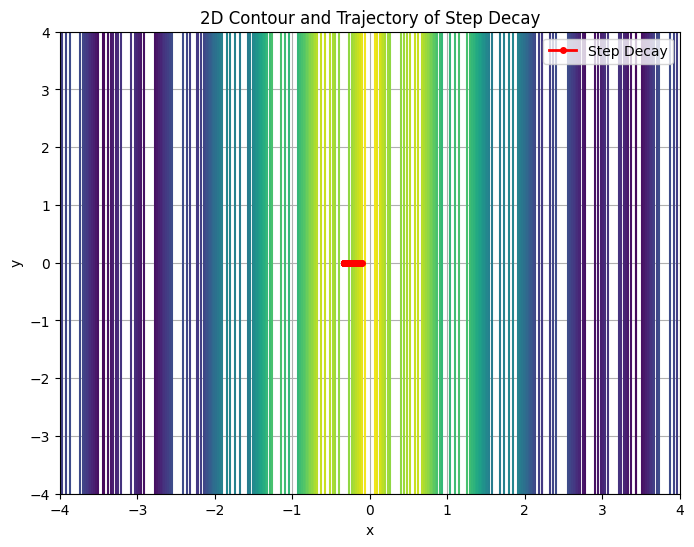

In [44]:
def noisy_cos_func(x):
    """
    "Зашумленная" функция на основе cos(x[0]) + 0.2*cos(10*x[0])
    Фактически детерминирована, но высокочастотный член выглядит как шум.
    """
    return np.cos(x[0]) + 0.2 * np.cos(10 * x[0])


def grad_noisy_cos_func(x):
    dx0 = -np.sin(x[0]) - 2.0 * np.sin(10 * x[0])
    dx1 = 0.0
    return np.array([dx0, dx1])


noisy_func = Function(noisy_cos_func)

methods = [
    ExponentialDecay(learning_rate=0.01, lambd=0.0002),
    PolynomialDecay(learning_rate=0.01, alpha=0.2, beta=1),
    ConstantDecay(learning_rate=0.01),
    StepDecay(learning_rate=0.01, step_size=10000, decay_factor=0.05)
]

x0_list = [
    [0.0, 0.0],
    [0.1, 0.0],
    [-0.1, 0.0]
]

for x0 in x0_list:
    print(f"\n=== Стартовая точка: {x0} ===")
    noisy_func.plot_all_methods(
        methods,
        x0,
        xrange=(-4, 4),
        yrange=(-4, 4),
        gradient=grad_noisy_cos_func
    )

# Дополнительное задание №2

Функция `cos(x) + 0.2 * cos(10x)` содержит много локальных минимумов и максимумов. Это делает её мультимодальной и сложной для оптимизации с помощью градиентного спуска. Цель — изучить, как различные стратегии шага справляются с этой задачей.

---

## Используемые методы

| Метод               | Стратегия шага                         | Гиперпараметры                                         |
|---------------------|----------------------------------------|--------------------------------------------------------|
| Exponential Decay   | alpha_t = alpha0 * exp(-lambda * t)    | learning_rate = 0.01, lambda = 0.0002                  |
| Polynomial Decay    | alpha_t = alpha0 / (1 + beta * t)^alpha| learning_rate = 0.01, alpha = 0.2, beta = 1            |
| Constant Decay      | Постоянный шаг                         | learning_rate = 0.01                                   |
| Step Decay          | Периодическое уменьшение шага          | learning_rate = 0.01, step_size = 10000, decay_factor = 0.05 |

---

## Результаты

### Начальная точка: [0.0, 0.0]

| Метод             | Найденный минимум | Значение f(x) | Итерации | Время (сек) | Комментарий                                |
|-------------------|-------------------|---------------|----------|--------------|---------------------------------------------|
| Exponential Decay | [0.0, 0.0]        | 1.2           | 0        | 0.0001       | Стартовал и сразу остановился (максимум)    |
| Polynomial Decay  | [0.0, 0.0]        | 1.2           | 0        | 0.0000       | Аналогично                                  |
| Constant Decay    | [0.0, 0.0]        | 1.2           | 0        | 0.0000       | Не двигается                                |
| Step Decay        | [0.0, 0.0]        | 1.2           | 0        | 0.0001       | То же самое                                 |

**Вывод:** если градиент равен нулю в начальной точке, метод останавливается — даже если это максимум, а не минимум.

---

### Начальная точка: [0.1, 0.0]

| Метод             | Найденный минимум | Значение f(x) | Итерации | Время (сек) |
|-------------------|-------------------|---------------|----------|-------------|
| Exponential Decay | [0.33, 0.0]       | 0.7485        | 100      | 0.0016      |
| Polynomial Decay  | [0.33, 0.0]       | 0.7485        | 253      | 0.0034      |
| Constant Decay    | [0.33, 0.0]       | 0.7485        | 99       | 0.0014      |
| Step Decay        | [0.33, 0.0]       | 0.7485        | 99       | 0.0014      |

---

### Начальная точка: [-0.1, 0.0]

| Метод             | Найденный минимум | Значение f(x) | Итерации | Время (сек) |
|-------------------|-------------------|---------------|----------|-------------|
| Exponential Decay | [-0.33, 0.0]      | 0.7485        | 100      | 0.0015      |
| Polynomial Decay  | [-0.33, 0.0]      | 0.7485        | 253      | 0.0036      |
| Constant Decay    | [-0.33, 0.0]      | 0.7485        | 99       | 0.0016      |
| Step Decay        | [-0.33, 0.0]      | 0.7485        | 99       | 0.0014      |

---

## Выводы

- Функция `cos(x) + 0.2 * cos(10x)` — мультимодальная и "зашумлённая", что затрудняет оптимизацию.
- Методы градиентного спуска сходятся к ближайшему локальному минимуму, но не глобальному.
- Если начальная точка попадает в максимум (градиент = 0), метод не делает ни одного шага.
- Polynomial Decay сходится медленно, но стабильно.
- Constant и Step Decay быстрее достигают минимума при хорошей настройке параметров.

---

## Рекомендации

- Запускать оптимизацию из нескольких стартовых точек, особенно для функций с множеством локальных минимумов.
- Использовать методы глобальной оптимизации:
  - Simulated Annealing
  - Genetic Algorithms
  - Байесовская оптимизация
- Можно также применять стохастические оптимизаторы (SGD, Adam), которые способны "перепрыгивать" через локальные экстремумы.
